In [1]:
# importing the relevant libraries
# only install the packages if they are not already available

# !pip install -U dataprep
# !pip install category_encoders
# !pip install optuna
# !pip install pygam

# importing relevant packages
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import plotly.graph_objects as go
import sklearn
import torch
import xgboost as xgb
import lightgbm as lgb
import optuna
import pygam

from category_encoders.cat_boost import CatBoostEncoder
from dataprep.eda import plot_correlation
from sklearn.linear_model import RidgeCV, LassoCV, LinearRegression
from plotly.offline import init_notebook_mode
from scipy.stats import norm, skew, boxcox_normmax
from scipy.special import boxcox1p
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import mean_squared_log_error,mean_squared_error,r2_score,mean_absolute_error
from sklearn.ensemble import RandomForestRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from optuna.samplers import TPESampler

import warnings
warnings.filterwarnings("ignore")
init_notebook_mode(connected = True)

print("Numpy Version: {}".format(np.__version__))
print("Seaborn Version: {}".format(sns.__version__))
print("Pandas Version: {}".format(pd.__version__))
print("Sklearn Version: {}".format(sklearn.__version__))
print("Torch Version: {}".format(torch.__version__))
print("XGBoost Version: {}".format(xgb.__version__))
print("LightGBM Version: {}".format(lgb.__version__))
print("Optuna Version: {}".format(optuna.__version__))
print("Pygam Version: {}".format(pygam.__version__))

Numpy Version: 1.22.3
Seaborn Version: 0.11.2
Pandas Version: 1.3.4
Sklearn Version: 0.24.2
Torch Version: 1.10.2+cpu
XGBoost Version: 1.6.0
LightGBM Version: 3.3.2
Optuna Version: 2.10.0
Pygam Version: 0.8.0


In [2]:
# cell to be deleted for submission 

# from google.colab import files
# uploaded = files.upload()

In [3]:
# importing the dataset and printing the first 5 rows 
df = pd.read_csv("listings.csv")
df.head(5)

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,11156,https://www.airbnb.com/rooms/11156,20211207182240,2021-12-08,An Oasis in the City,Very central to the city which can be reached ...,"It is very close to everything and everywhere,...",https://a0.muscache.com/pictures/2797669/17895...,40855,https://www.airbnb.com/users/show/40855,...,4.77,4.82,4.71,NaN,f,1,0,1,0,1.34
1,14250,https://www.airbnb.com/rooms/14250,20211207182240,2021-12-08,Manly Harbour House,"Beautifully renovated, spacious and quiet, our...",Balgowlah Heights is one of the most prestigio...,https://a0.muscache.com/pictures/56935671/fdb8...,55948,https://www.airbnb.com/users/show/55948,...,4.33,4.67,4.33,Exempt,f,2,2,0,0,0.04
2,15253,https://www.airbnb.com/rooms/15253,20211207182240,2021-12-08,Unique Designer Rooftop Apartment in City Loca...,Penthouse living at it best ... You will be st...,The location is really central and there is nu...,https://a0.muscache.com/pictures/46dcb8a1-5d5b...,59850,https://www.airbnb.com/users/show/59850,...,4.67,4.70,4.47,PID-STRA-24061-7,t,1,0,1,0,3.21
3,44545,https://www.airbnb.com/rooms/44545,20211207182240,2021-12-08,Sunny Darlinghurst Warehouse Apartment,Sunny warehouse/loft apartment in the heart of...,Darlinghurst is home to some of Sydney's best ...,https://a0.muscache.com/pictures/a88d8e14-4f63...,112237,https://www.airbnb.com/users/show/112237,...,4.96,4.93,4.77,NaN,f,1,1,0,0,0.56
4,58506,https://www.airbnb.com/rooms/58506,20211207182240,2021-12-08,"Studio Yindi @ Mosman, Sydney","An open plan apartment, which opens onto a spa...","Mosman is a smart, middle to upper class subur...",https://a0.muscache.com/pictures/23497720/d30f...,279955,https://www.airbnb.com/users/show/279955,...,4.90,4.73,4.68,PID-STRA-6093,f,1,1,0,0,2.23


## Data Pre-Processing & Cleaning ## 

<AxesSubplot:>

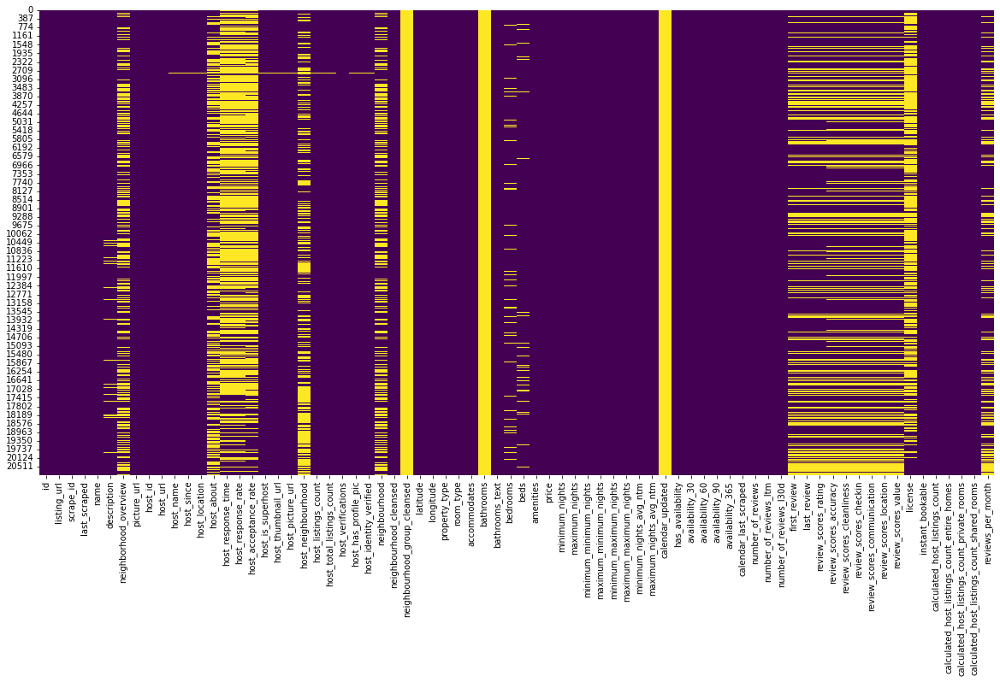

In [4]:
# visualizing the missing values 

fig, ax = plt.subplots(figsize=(20,10)) 
sns.heatmap(df.isnull(),cbar=False,cmap='viridis', ax=ax)

#plt.savefig("missing_values_hm.png")

In [5]:
# dtypes conversion 

# last_scraped from object to datetime 
# host_since from object to datetime 
# first_review from object to datetime
# last_review from object to datetime
# calendar_last_scraped from object to datetime 

columns = ['last_scraped', 'host_since', 'first_review', 'last_review', 'calendar_last_scraped']
for col in columns:
    ini_obj = df[col].dtype
    df[col] = pd.to_datetime(df[col], format='%Y/%m/%d')
    conv_obj = df[col].dtype
    print("Column {} has been converted from dtype {} to dtype {}".format(col, ini_obj, conv_obj))

print("\n")

# host_response_time from object to categorical 
# room_type from object to categorical 

cat_cols = ['host_response_time', 'room_type']
for col in cat_cols:
    ini_obj = df[col].dtype
    df[col] = df[col].astype("category")
    conv_obj = df[col].dtype
    print("Column {} has been converted from dtype {} to dtype {}".format(col, ini_obj, conv_obj))

print("\n")

# host_response_rate from object to float64
# host_acceptance_rate from object to float64

def p2f(x):
    return float(x.strip('%'))/100

flt_cols = ['host_response_rate', 'host_acceptance_rate']
for col in flt_cols:
    ini_obj = df[col].dtype
    df[col] = df[col].map(p2f, na_action='ignore')
    conv_obj = df[col].dtype
    print("Column {} has been converted from dtype {} to dtype {}".format(col, ini_obj, conv_obj))

print("\n")

# host_is_superhost from object to boolean
# host_has_profile_pic from object to boolean
# host_identity_verified from object to boolean
# has_availability from object to boolean
# instant_bookable from object to boolean 

bool_columns = ['host_is_superhost', 'host_has_profile_pic', 'host_identity_verified', 'has_availability', 'instant_bookable']
for col in bool_columns:
    ini_obj = df[col].dtype
    df[col] = df[col].map({'f':False, 't':True}, na_action='ignore')
    df[col] = df[col].astype('boolean')
    conv_obj = df[col].dtype
    print("Column {} has been converted from dtype {} to dtype {}".format(col, ini_obj, conv_obj))
    
# note here that astype('boolean') is experimental support for nullable boolean for pandas version >= 1.0 only
# otherwise, using astype(bool) will convert NaNs to True
# Boolean conversion is correct as of 21/04/2022 on pandas version 1.3.4

print("\n")

# converting all ids from integer to string 
# id from int64 to object
# scrape_id from int64 to object
# host_id from int64 to object

string_columns = ['id', 'scrape_id', 'host_id']
for col in string_columns:
    ini_obj = df[col].dtype
    df[col] = df[col].astype('object')
    conv_obj = df[col].dtype
    print("Column {} has been converted from dtype {} to dtype {}".format(col, ini_obj, conv_obj))
    
print("\n")
    
def price2f(x):
    x_stripp = x.strip('$')
    x_stripc = x_stripp.replace(',','')
    return float(x_stripc)

price_column = ['price']
for col in price_column:
    ini_obj = df[col].dtype
    df[col] = df[col].map(price2f, na_action='ignore')
    conv_obj = df[col].dtype
    print("Column {} has been converted from dtype {} to dtype {}".format(col, ini_obj, conv_obj))

Column last_scraped has been converted from dtype object to dtype datetime64[ns]
Column host_since has been converted from dtype object to dtype datetime64[ns]
Column first_review has been converted from dtype object to dtype datetime64[ns]
Column last_review has been converted from dtype object to dtype datetime64[ns]
Column calendar_last_scraped has been converted from dtype object to dtype datetime64[ns]


Column host_response_time has been converted from dtype object to dtype category
Column room_type has been converted from dtype object to dtype category


Column host_response_rate has been converted from dtype object to dtype float64
Column host_acceptance_rate has been converted from dtype object to dtype float64


Column host_is_superhost has been converted from dtype object to dtype boolean
Column host_has_profile_pic has been converted from dtype object to dtype boolean
Column host_identity_verified has been converted from dtype object to dtype boolean
Column has_availability

In [6]:
# dropping columns with all NaN values 
# these columns add no value to the dataset, even with imputation they will all be the same number

df = df.drop(["bathrooms", "calendar_updated", 'neighbourhood_group_cleansed'], axis=1)

# creating a separate dataset without geographical coordinates for EDA purposes
df_geo = df.loc[:,["latitude", "longitude"]]
df_nogeo = df.drop(["latitude", "longitude"], axis=1)

# creating a separate dataset without response variable (price) for EDA purposes
df_price = df["price"]
df_features = df_nogeo.drop(["price"],axis=1)

# df = pre-processed original dataset (excluded irrelevant columns)
# df_nogeo = pre-process original dataset, less the latitude and longitude
# df_price = only the response variable column
# df_features = pre-processed original dataset, less response (price), longitude and latitude 

## Exploratory Data Analysis ##

In [7]:
# separating numerical and categorical features for eda purposes 

df_num = df_nogeo.select_dtypes(include = ['float64', 'int64'])  # numeric variables 
df_cat = df_nogeo.select_dtypes(include = ['category']) # categorical variables 
df_bool = df_nogeo.select_dtypes(include = ['boolean']) # boolean variables 

### Univariate Analysis

In [8]:
# descriptive statistics for numerical variables 

df_num.describe().T 

,count,mean,std,min,25%,50%,75%,max
host_response_rate,7884.0,9.046258e-01,2.424745e-01,0.00,0.97,1.00,1.00,1.000000e+00
host_acceptance_rate,8846.0,7.755584e-01,3.159217e-01,0.00,0.68,0.94,1.00,1.000000e+00
host_listings_count,20877.0,1.094937e+01,4.099329e+01,0.00,1.00,1.00,3.00,4.570000e+02
host_total_listings_count,20877.0,1.094937e+01,4.099329e+01,0.00,1.00,1.00,3.00,4.570000e+02
accommodates,20880.0,3.383333e+00,2.188119e+00,1.00,2.00,2.00,4.00,1.600000e+01
bedrooms,19444.0,1.704330e+00,1.036077e+00,1.00,1.00,1.00,2.00,1.800000e+01
beds,19976.0,2.039848e+00,1.538269e+00,1.00,1.00,1.00,3.00,3.900000e+01
price,20880.0,2.511662e+02,4.985989e+02,13.00,80.00,140.00,250.00,2.861300e+04
minimum_nights,20880.0,6.218946e+01,5.273935e+01,1.00,4.00,90.00,90.00,1.125000e+03
maximum_nights,20880.0,9.050510e+02,4.070761e+02,1.00,1125.00,1125.00,1125.00,1.500000e+03


In [9]:
# descriptive statistics for boolean and categorical variables 

boodes = df_bool.describe().T 
catdes = df_cat.describe().T 
pd.concat([boodes, catdes])

,count,unique,top,freq
host_is_superhost,20877,2,False,17841
host_has_profile_pic,20877,2,True,20778
host_identity_verified,20877,2,True,16295
has_availability,20880,2,True,20597
instant_bookable,20880,2,False,13516
host_response_time,7884,4,within an hour,4585
room_type,20880,4,Entire home/apt,13398


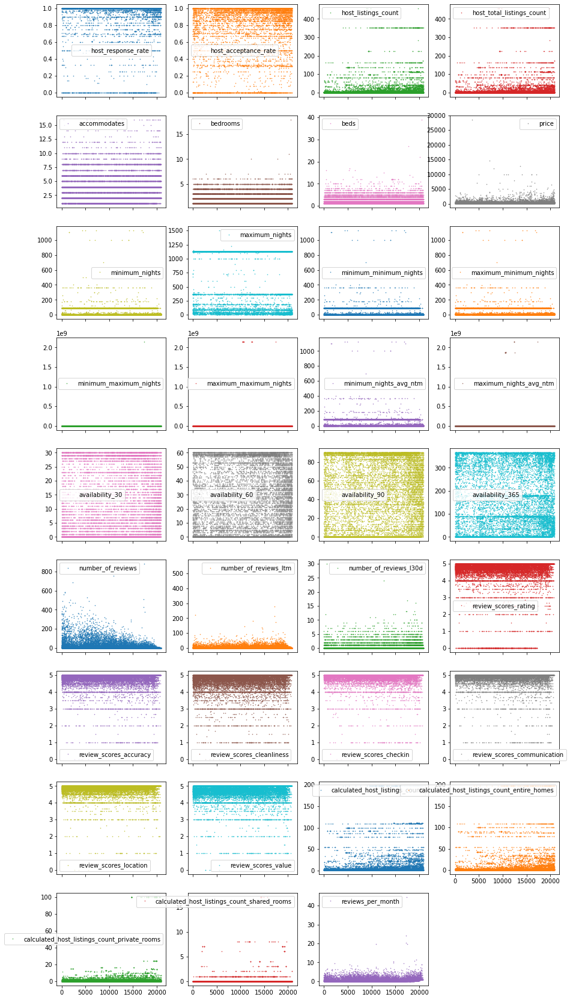

In [10]:
df_num.plot(lw=0, marker=".", subplots=True, layout=(-1, 4),
          figsize=(15, 30), markersize=1);

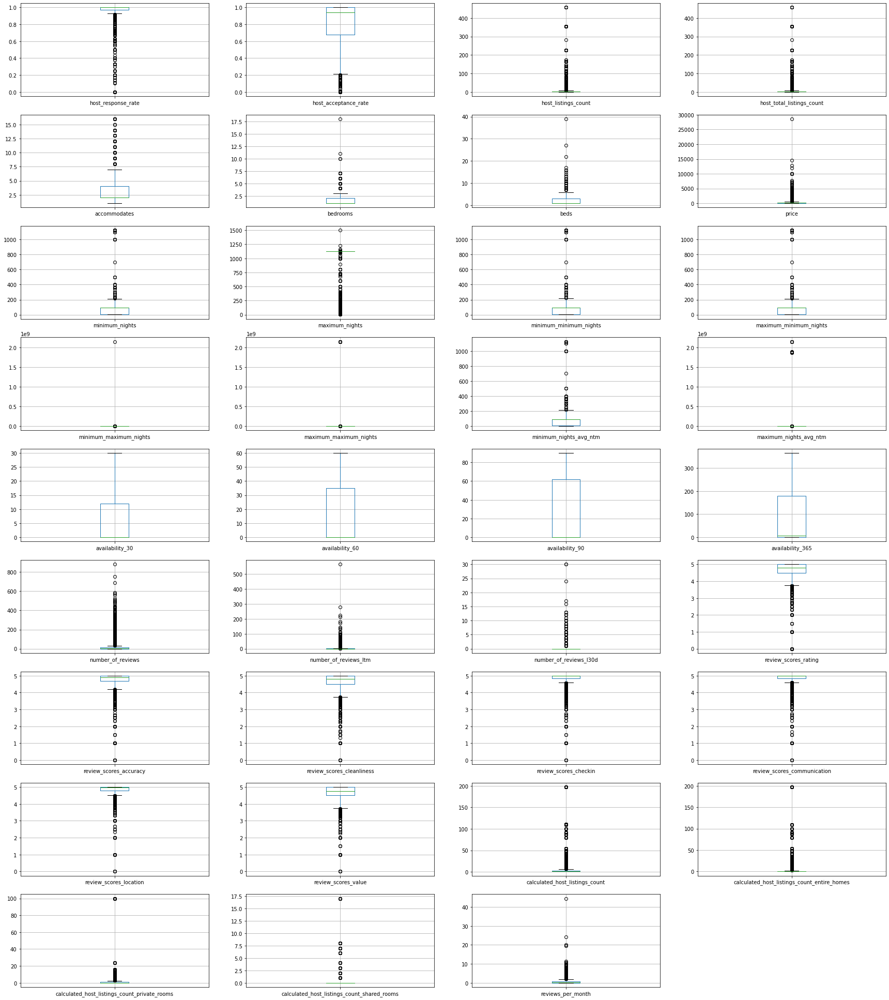

In [11]:
# plotting the boxplot of all numerical features 

fig, ax = plt.subplots(9, 4, figsize=(30,35))
ix = np.ndindex(9, 4)

for col in df_num.columns:
    col_index = df_num.columns.get_loc(col)
    index = next(ix)
    df_num.boxplot([col], ax=ax[index])
    #ax[index].set_xlabel(col)

# remove the 1 unused ax from the plot 

for ax in ax.flat[35:]:
    ax.remove()    
    
#plt.savefig("int_against_target_box.png")

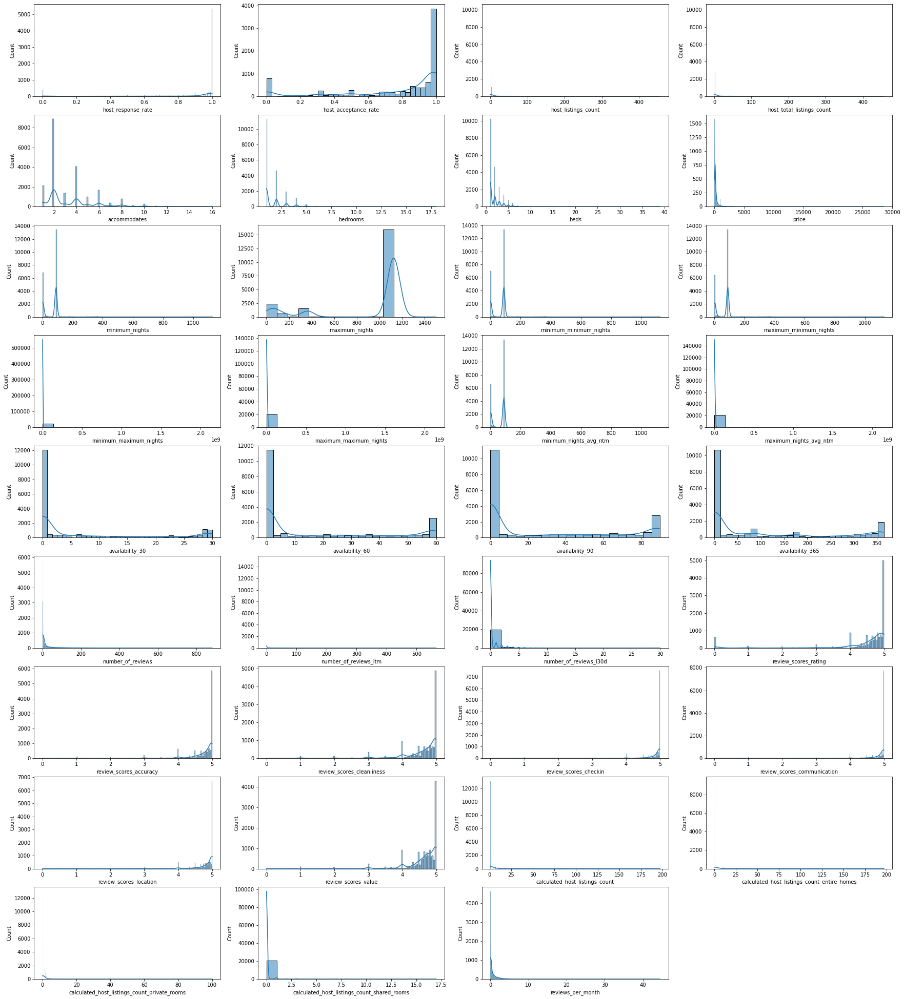

In [12]:
fig, ax = plt.subplots(9, 4, figsize=(30,35))
ix = np.ndindex(9, 4)

for col in df_num.columns:
    index = next(ix)
    sns.histplot(x = df_num[col], ax=ax[index], kde=True)
    #ax[index].set_xlabel(col)

# remove the 1 unused ax from the plot 

for ax in ax.flat[35:]:
    ax.remove()    

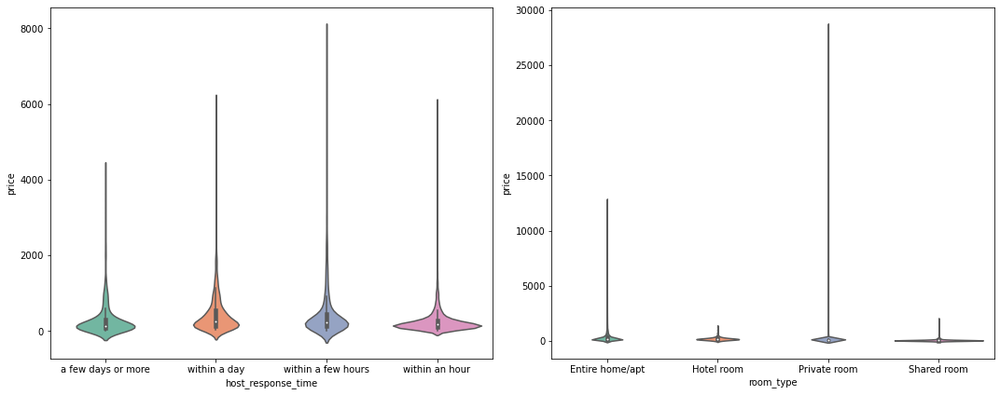

In [13]:
# violin plot of categorical variables 
fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(15, 6))

# Loop through these features and plot entries from each feature against `Latitude`
for col, ax in zip(df_cat.columns, axes.ravel()):
    sns.violinplot(data=df_nogeo, x=col, y=df_nogeo["price"], palette="Set2",
                   split=True, ax=ax)
plt.tight_layout();

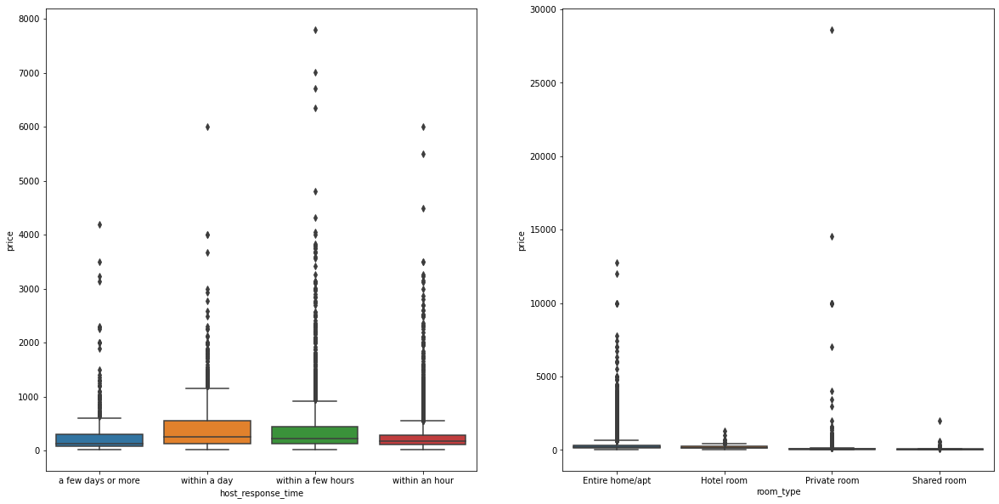

In [14]:
# plotting the boxplot of categorical features 

fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(20, 10))

for col, ax in zip(df_cat.columns, axes.ravel()):
    sns.boxplot(data=df_nogeo, x=col, y=df_nogeo["price"], ax=ax)

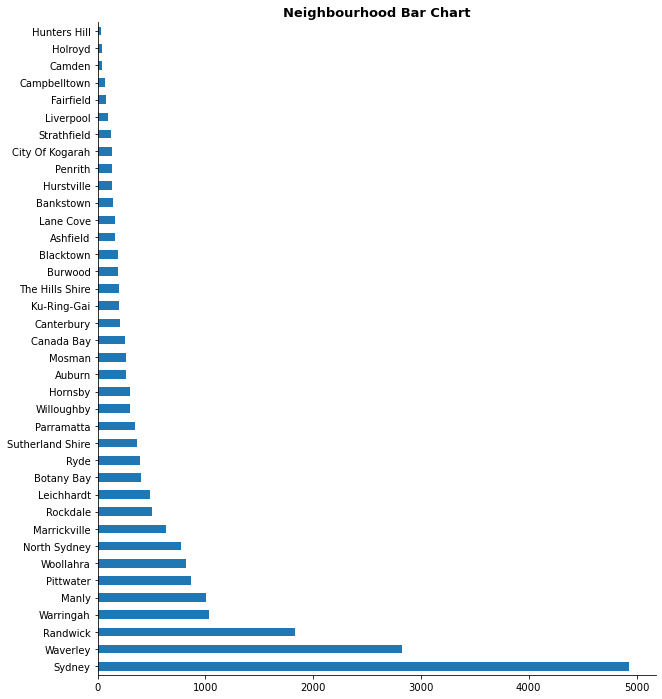

In [15]:
# count of neighbourhoods bar chart 

fig, ax = plt.subplots(figsize=(10,12))
df_nogeo['neighbourhood_cleansed'].value_counts().plot(kind='barh')
sns.despine(fig = fig, ax = ax)
ax.set_title('Neighbourhood Bar Chart', fontweight='bold', fontsize=13)
plt.show()

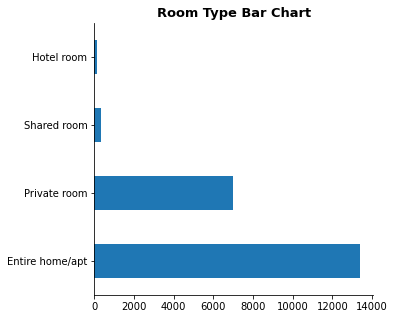

In [16]:
fig, ax = plt.subplots(figsize=(5,5))
df_nogeo['room_type'].value_counts().plot(kind='barh')
sns.despine(fig = fig, ax = ax)
ax.set_title('Room Type Bar Chart', fontweight='bold', fontsize=13)
plt.show()

### Bivariate Analysis and Multivariate Analysis

In [17]:
# examining the correlation between price (the response variable) with all possible predictor variables 

df_nogeo.corr().loc["price",:] 

# unsurprisingly, some of the highest (linearly) correlated features are accommodates, bedrooms and beds 

host_response_rate                             -0.020005
host_acceptance_rate                           -0.141284
host_is_superhost                               0.012279
host_listings_count                             0.079998
host_total_listings_count                       0.079998
host_has_profile_pic                           -0.011472
host_identity_verified                          0.052403
accommodates                                    0.434278
bedrooms                                        0.475528
beds                                            0.402607
price                                           1.000000
minimum_nights                                 -0.052247
maximum_nights                                 -0.100982
minimum_minimum_nights                         -0.054058
maximum_minimum_nights                         -0.051017
minimum_maximum_nights                         -0.000297
maximum_maximum_nights                         -0.000094
minimum_nights_avg_ntm         

In [18]:
# correlation matrix

df_nogeo.corr()

,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,accommodates,bedrooms,beds,...,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
host_response_rate,1.000000,0.485664,0.213335,0.080142,0.080142,0.008445,0.198284,0.015918,-0.020840,-0.014496,...,0.121410,0.117677,0.079046,0.086697,0.088695,0.071871,0.056546,0.045043,-0.017187,0.170539
host_acceptance_rate,0.485664,1.000000,0.216308,0.018646,0.018646,0.006389,0.142671,-0.072506,-0.117065,-0.059447,...,-0.008975,-0.013445,-0.011457,0.003127,0.361325,0.047248,0.004406,0.087378,0.054446,0.266584
host_is_superhost,0.213335,0.216308,1.000000,-0.062770,-0.062770,0.026497,0.169504,0.028239,-0.007868,0.006686,...,0.123719,0.131489,0.102922,0.154889,-0.003667,-0.080244,-0.071955,-0.034335,-0.030478,0.338331
host_listings_count,0.080142,0.018646,-0.062770,1.000000,1.000000,0.016516,-0.098713,0.071282,0.079557,0.036243,...,-0.080009,-0.101106,-0.003355,-0.092477,0.122215,0.938670,0.925780,0.175931,-0.005672,0.036651
host_total_listings_count,0.080142,0.018646,-0.062770,1.000000,1.000000,0.016516,-0.098713,0.071282,0.079557,0.036243,...,-0.080009,-0.101106,-0.003355,-0.092477,0.122215,0.938670,0.925780,0.175931,-0.005672,0.036651
host_has_profile_pic,0.008445,0.006389,0.026497,0.016516,0.016516,1.000000,0.032465,0.006362,0.000069,-0.001835,...,0.046219,0.045652,0.035484,0.015724,-0.016167,0.018224,0.016387,0.007997,0.002118,0.001939
host_identity_verified,0.198284,0.142671,0.169504,-0.098713,-0.098713,0.032465,1.000000,0.102986,0.058417,0.070389,...,0.063080,0.081650,0.063577,0.074383,-0.022229,-0.075513,-0.090627,0.035629,0.004461,0.160069
accommodates,0.015918,-0.072506,0.028239,0.071282,0.071282,0.006362,0.102986,1.000000,0.868199,0.840070,...,0.032743,0.032342,0.062460,-0.014049,-0.070999,0.087557,0.118039,-0.081321,-0.042349,0.036474
bedrooms,-0.020840,-0.117065,-0.007868,0.079557,0.079557,0.000069,0.058417,0.868199,1.000000,0.815046,...,0.043877,0.040874,0.058852,-0.015074,-0.089696,0.090807,0.128959,-0.090182,-0.058327,-0.033389
beds,-0.014496,-0.059447,0.006686,0.036243,0.036243,-0.001835,0.070389,0.840070,0.815046,1.000000,...,0.025234,0.026436,0.040933,-0.018440,-0.054226,0.054851,0.074243,-0.067896,0.165383,0.004726


In [19]:
# credits to user @arun's answer on stack overflow
# https://stackoverflow.com/questions/17778394/list-highest-correlation-pairs-from-a-large-correlation-matrix-in-pandas 

def get_redundant_pairs(df):
    '''Get diagonal and lower triangular pairs of correlation matrix'''
    pairs_to_drop = set()
    cols = df.columns
    for i in range(0, df.shape[1]):
        for j in range(0, i+1):
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop

def get_top_abs_correlations(df, n=5, corr_method = 'pearson'):
    au_corr = df.corr(method = corr_method).abs().unstack()
    labels_to_drop = get_redundant_pairs(df)
    au_corr = au_corr.drop(labels=labels_to_drop).sort_values(ascending=False)
    return au_corr[0:n]

In [20]:
# inspect the top absolute correlations between all numerical variables 

print("Top Absolute Pearson Correlations") 
print(get_top_abs_correlations(df_num, 5, 'pearson'))
print("\n")
print("Top Absolute Kendall Correlations") 
print(get_top_abs_correlations(df_num, 10, 'kendall')) 

Top Absolute Pearson Correlations
host_listings_count     host_total_listings_count    1.000000
maximum_minimum_nights  minimum_nights_avg_ntm       0.998230
maximum_maximum_nights  maximum_nights_avg_ntm       0.997966
minimum_minimum_nights  minimum_nights_avg_ntm       0.996102
minimum_nights          minimum_nights_avg_ntm       0.993870
dtype: float64


Top Absolute Kendall Correlations
host_listings_count     host_total_listings_count    1.000000
minimum_maximum_nights  maximum_nights_avg_ntm       0.986717
maximum_maximum_nights  maximum_nights_avg_ntm       0.978825
minimum_maximum_nights  maximum_maximum_nights       0.965447
minimum_nights          minimum_minimum_nights       0.960870
minimum_minimum_nights  minimum_nights_avg_ntm       0.958634
maximum_minimum_nights  minimum_nights_avg_ntm       0.953729
minimum_nights          minimum_nights_avg_ntm       0.953570
availability_60         availability_90              0.952174
minimum_nights          maximum_minimum_nights 

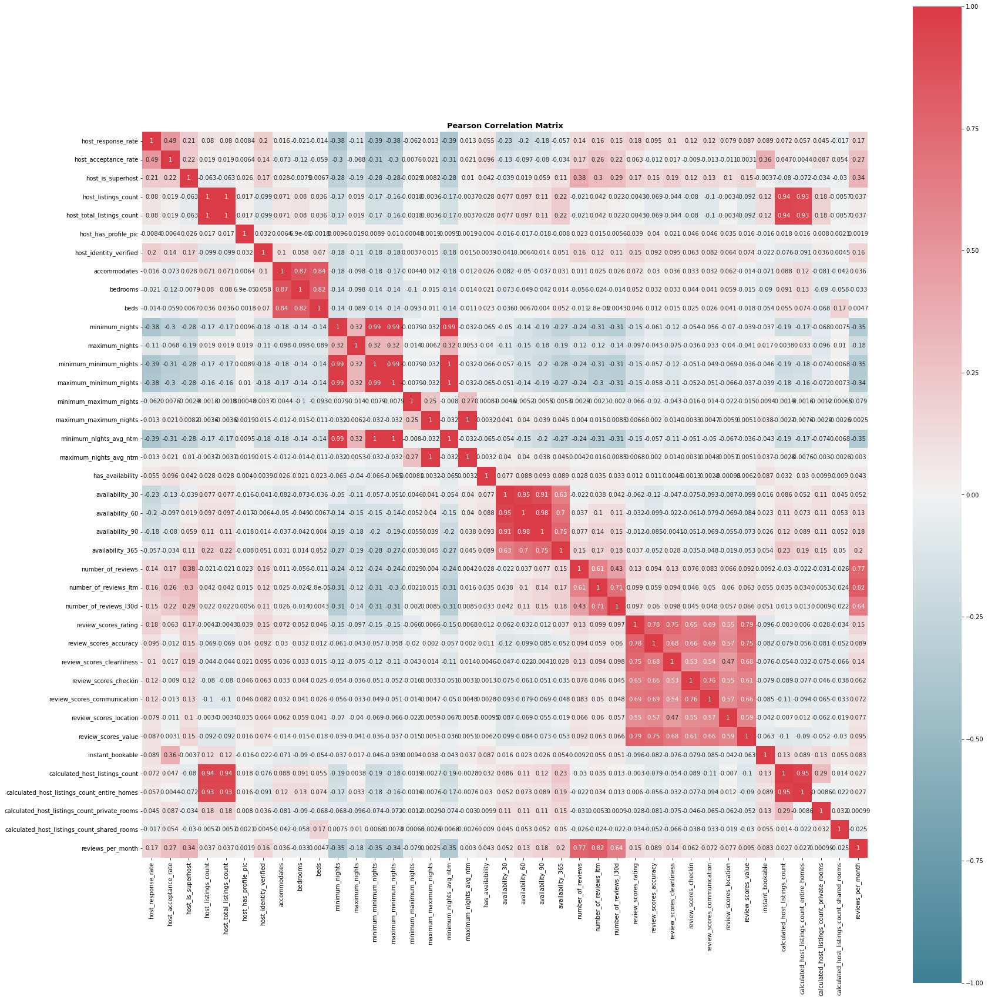

In [21]:
# Pearson Correlation heatmap between integer features

fig, ax = plt.subplots(figsize=(25,25))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(df_features.corr(), vmax=1, vmin=-1, center=0, square=True, annot = True, ax=ax, cmap=cmap)
ax.set_title('Pearson Correlation Matrix', fontweight='bold', fontsize=13)
plt.tight_layout()
#plt.show()
#plt.savefig("Pearson Correlation Matrix Heatmap.png")

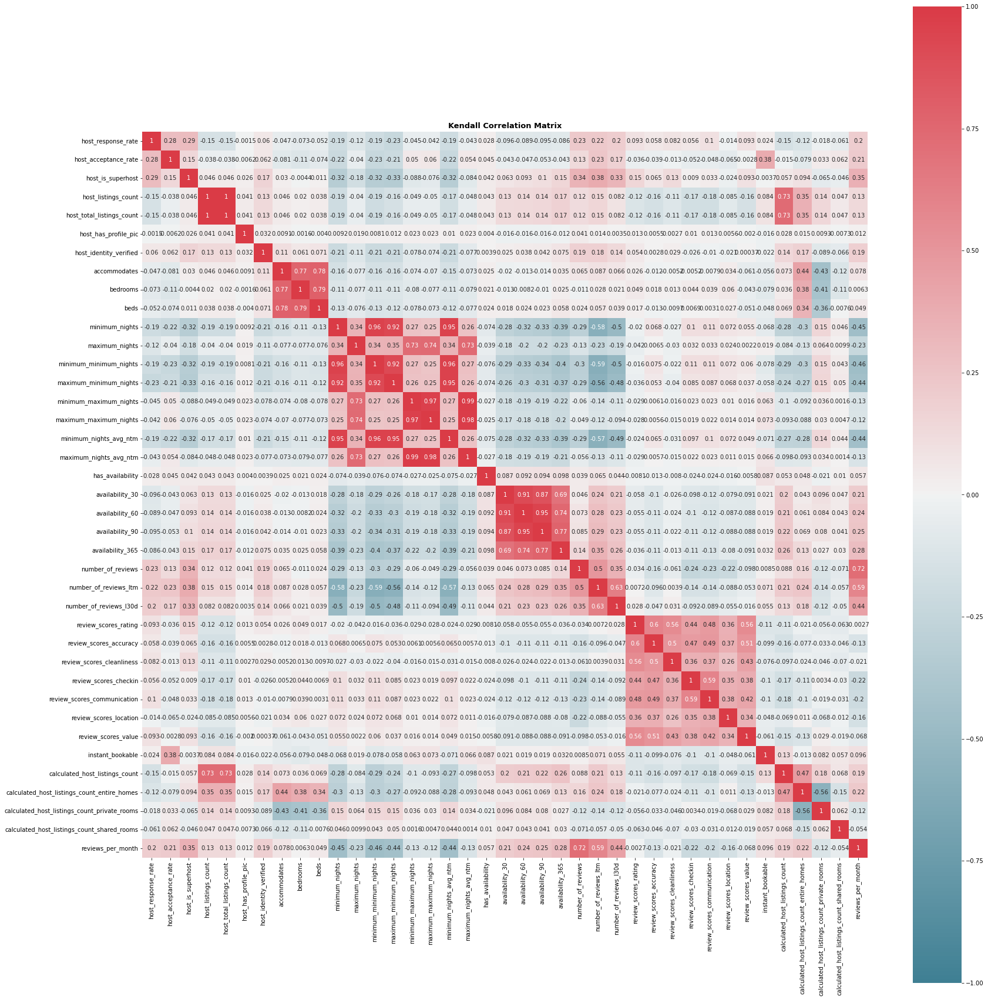

In [22]:
# Kendall Correlation heatmap between integer features

fig, ax = plt.subplots(figsize=(25,25))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(df_features.corr(method = 'kendall'), vmax=1, vmin=-1, center=0, square=True, annot = True, ax=ax, cmap=cmap)
ax.set_title('Kendall Correlation Matrix', fontweight='bold', fontsize=13)
plt.tight_layout()
#plt.show()
#plt.savefig("Kendall Correlation Matrix Heatmap.png")

In [23]:
#Pearson - measures the strength and direction of linear relationship
#Spearman - measures monotonic relationshiip (might be non-linear increase/decrease), more sensitive to errors and deviations than Kendall Tau
#KenallTau - similar to Spearman, measures monotonic relationship, but less sensitive to errors and deviations

df_nogeo_price = df_nogeo.copy()
df_nogeo_price['price'] = df_price

#### Explore the Correlation between Different Availability Measures

As seen in the Pearson correlation matrix and Kendall correlation matrix, some features have a strong correlation with others. For example, different Availability measures have strong multicollinearity, as well as different Review Score measures.

The session below explores the multicollinearity between different Availability measures.

In [24]:
avail = ['availability_30', 'availability_60',
       'availability_90', 'availability_365']
avail_df = df_nogeo[avail]

#Scatter plot on different Availability measures


pairplot = sns.pairplot(avail_df)
pairplot.fig.suptitle('Pairplot on Availability', y = '1.05')
plt.show()

# Kendall Correlation heatmap between Availability measures

fig, ax = plt.subplots(figsize=(8,8))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(avail_df.corr(method = 'kendall'), vmax=1, vmin=-1, center=0, square=True, annot = True, ax=ax, cmap=cmap)
ax.set_title('Kendall Correlation Matrix between Availability Measures', fontweight='bold', fontsize=13)
plt.tight_layout()
#plt.show()
#plt.savefig("Kendall Correlation Matrix between Availability Measures.png")

  0%|          | 0/111 [00:00<?, ?it/s]


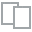
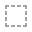
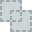
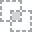
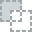
...
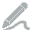
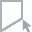
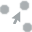
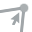
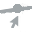

In [25]:
avail.append('price')
plot_correlation(df_nogeo[avail], 'price')

### Handle the missing value

  0%|          | 0/13 [00:00<?, ?it/s]

bokeh.core.validation.check - ERROR - E-1019 (DUPLICATE_FACTORS): FactorRange must specify a unique list of categorical factors for an axis: duplicate factors found: 'review_scores...ion', 'calculated_ho...oms'



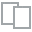
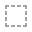
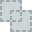
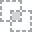
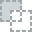
...
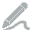
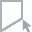
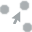
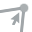
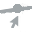

In [26]:
from dataprep.eda.missing import plot_missing
plot_missing(df_nogeo, display=['Stats', 'Bar Chart'])

In [27]:
df_nogeo.isnull().sum().sort_values(ascending=False).head(10)

license                  13387
host_response_time       12996
host_response_rate       12996
host_acceptance_rate     12034
host_about                9656
host_neighbourhood        9028
neighborhood_overview     8291
neighbourhood             8289
review_scores_value       6432
review_scores_checkin     6428
dtype: int64

In [28]:
# filling nulls from numerical, boolean columns with its median, and categorical with its mean

df_nogeo[list(df_num.columns)] = df_nogeo[list(df_num.columns)].fillna(value=df[list(df_num.columns)].median())
df_nogeo[list(df_bool.columns)] = df_nogeo[list(df_bool.columns)].astype("object")
df_nogeo[list(df_bool.columns)] = df_nogeo[list(df_bool.columns)].fillna(value=df[list(df_bool.columns)].mode())
df_nogeo[list(df_bool.columns)] = df_nogeo[list(df_bool.columns)].astype("boolean")
df_nogeo[list(df_cat.columns)] = df_nogeo[list(df_cat.columns)].astype('object')
df_nogeo[list(df_cat.columns)] = df_nogeo[list(df_cat.columns)].fillna(value=df[list(df_cat.columns)].mode())
df_nogeo[list(df_cat.columns)] = df_nogeo[list(df_cat.columns)].astype("category")



In [29]:
df_nogeo['host_response_time'] = df_nogeo['host_response_time'].fillna(df_nogeo['host_response_time'].mode().values[0])

df_nogeo['host_is_superhost'] = df_nogeo['host_is_superhost'].astype('object')
df_nogeo['host_is_superhost'] = df_nogeo['host_is_superhost'].fillna(df_nogeo['host_is_superhost'].mode().values[0])
df_nogeo['host_is_superhost'] = df_nogeo['host_is_superhost'].astype('category')


df_nogeo['host_has_profile_pic'] = df_nogeo['host_has_profile_pic'].astype('object')
df_nogeo['host_has_profile_pic'] = df_nogeo['host_has_profile_pic'].fillna(df_nogeo['host_has_profile_pic'].mode().values[0])
df_nogeo['host_has_profile_pic'] = df_nogeo['host_has_profile_pic'].astype('boolean')

df_nogeo['host_identity_verified'] = df_nogeo['host_identity_verified'].astype('object')
df_nogeo['host_identity_verified'] = df_nogeo['host_identity_verified'].fillna(df_nogeo['host_identity_verified'].mode().values[0])
df_nogeo['host_identity_verified'] = df_nogeo['host_identity_verified'].astype('boolean')

In [30]:
# check for missing values again, the values below all belong to dtype "object"

df_nogeo.isnull().sum().sort_values(ascending=False).head(20)

license                   13387
host_about                 9656
host_neighbourhood         9028
neighborhood_overview      8291
neighbourhood              8289
last_review                5809
first_review               5809
description                 754
bathrooms_text               24
host_location                21
name                          7
host_name                     3
host_since                    3
host_thumbnail_url            3
host_picture_url              3
availability_90               0
has_availability              0
maximum_nights_avg_ntm        0
calendar_last_scraped         0
availability_60               0
dtype: int64

In [31]:
# re-applying the code to update the respective dataframes 

df_num = df_nogeo.select_dtypes(include = ['float64', 'int64'])  # numeric variables 
df_cat = df_nogeo.select_dtypes(include = ['category']) # categorical variables 
df_bool = df_nogeo.select_dtypes(include = ['boolean']) # boolean variables 

df_allf = df_nogeo.select_dtypes(include = ['float64', 'int64', 'boolean','category']) # all but dtype object
df_allf.describe()

,host_response_rate,host_acceptance_rate,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,accommodates,bedrooms,beds,price,...,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
count,20880.000000,20880.000000,20880.000000,20880.000000,20880,20880,20880.000000,20880.000000,20880.000000,20880.000000,...,20880.000000,20880.000000,20880.000000,20880.000000,20880,20880.000000,20880.000000,20880.000000,20880.000000,20880.000000
unique,NaN,NaN,NaN,NaN,2,2,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,2,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,True,True,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,False,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,20781,16298,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,13516,NaN,NaN,NaN,NaN,NaN
mean,0.963988,0.870333,10.947941,10.947941,NaN,NaN,3.383333,1.655891,1.994828,251.166188,...,4.878256,4.876066,4.860676,4.673112,NaN,8.094540,6.718966,1.274713,0.060201,0.518671
std,0.156000,0.221098,40.990521,40.990521,NaN,NaN,2.188119,1.015578,1.519411,498.598911,...,0.375271,0.391744,0.326520,0.452732,NaN,25.191637,24.134766,7.428643,0.645488,0.948811
min,0.000000,0.000000,0.000000,0.000000,NaN,NaN,1.000000,1.000000,1.000000,13.000000,...,0.000000,0.000000,0.000000,0.000000,NaN,1.000000,0.000000,0.000000,0.000000,0.010000
25%,1.000000,0.940000,1.000000,1.000000,NaN,NaN,2.000000,1.000000,1.000000,80.000000,...,4.920000,4.930000,4.880000,4.670000,NaN,1.000000,0.000000,0.000000,0.000000,0.090000
50%,1.000000,0.940000,1.000000,1.000000,NaN,NaN,2.000000,1.000000,1.000000,140.000000,...,5.000000,5.000000,4.960000,4.770000,NaN,1.000000,1.000000,0.000000,0.000000,0.200000
75%,1.000000,0.940000,3.000000,3.000000,NaN,NaN,4.000000,2.000000,2.000000,250.000000,...,5.000000,5.000000,5.000000,4.880000,NaN,3.000000,1.000000,1.000000,0.000000,0.470000


In [32]:
(df_allf.columns)

Index(['host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_listings_count', 'host_total_listings_count',
       'host_has_profile_pic', 'host_identity_verified', 'room_type',
       'accommodates', 'bedrooms', 'beds', 'price', 'minimum_nights',
       'maximum_nights', 'minimum_minimum_nights', 'maximum_minimum_nights',
       'minimum_maximum_nights', 'maximum_maximum_nights',
       'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'has_availability',
       'availability_30', 'availability_60', 'availability_90',
       'availability_365', 'number_of_reviews', 'number_of_reviews_ltm',
       'number_of_reviews_l30d', 'review_scores_rating',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value', 'instant_bookable',
       'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',


In [33]:
df_allf['host_response_rate']

0        1.00
1        1.00
2        1.00
3        1.00
4        1.00
         ... 
20875    1.00
20876    1.00
20877    0.91
20878    1.00
20879    1.00
Name: host_response_rate, Length: 20880, dtype: float64

## Feature Engineering ##

In [34]:
# For boolean predictors, create a dummy variable (0 or 1) to represent True or False

labels = ['host_is_superhost', 'host_has_profile_pic', 'host_identity_verified',
       'has_availability', 'instant_bookable']
for label in labels:
    df_allf[label] = pd.get_dummies(df_allf[label], drop_first=True)

In [35]:
# Adding high cardinality variables
# Neighbourhood is treated as a categorical variable here 

variable = 'neighbourhood_cleansed_aggregate'
df_allf['neighbourhood_cleansed_aggregate'] = df_nogeo['neighbourhood_cleansed']

counts = df_allf['neighbourhood_cleansed_aggregate'].value_counts() 
for level in counts.index:
    if counts[level] < 250:
        df_allf.loc[df_allf[variable]==level, variable] = 'Other'

df_allf['neighbourhood_cleansed_aggregate'] = df_allf['neighbourhood_cleansed_aggregate'].fillna(value=df_allf['neighbourhood_cleansed_aggregate'].mode())

df_allf['neighbourhood_cleansed_aggregate'] = df_allf['neighbourhood_cleansed_aggregate'].astype("category") 

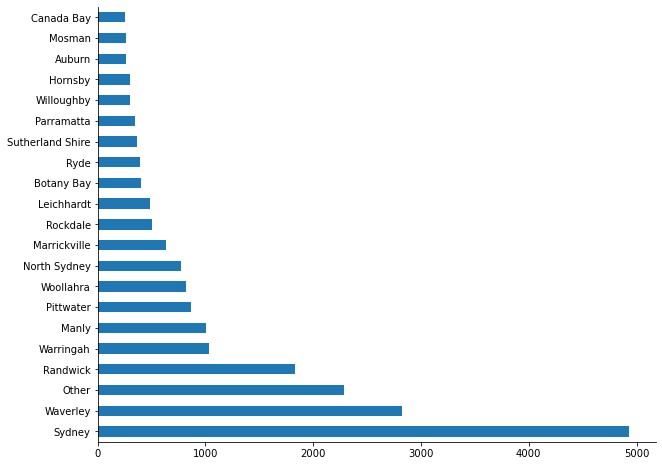

In [36]:
fig, ax = plt.subplots(figsize=(10,8))
df_allf['neighbourhood_cleansed_aggregate'].value_counts().plot(kind='barh')
sns.despine()
plt.show()

In [37]:
# Adding high cardinality variables
# Property type is treated as a categorical variable here 

variable = 'property_type_aggregate'
df_allf['property_type_aggregate'] = df_nogeo['property_type']

counts = df_allf[variable].value_counts() 
for level in counts.index:
    if counts[level] < 100:
        df_allf.loc[df_allf[variable]==level, variable] = 'Other'

df_allf['property_type_aggregate'] = df_allf['property_type_aggregate'].fillna(value=df_allf['property_type_aggregate'].mode())

df_allf['property_type_aggregate'] = df_allf['property_type_aggregate'].astype("category") 

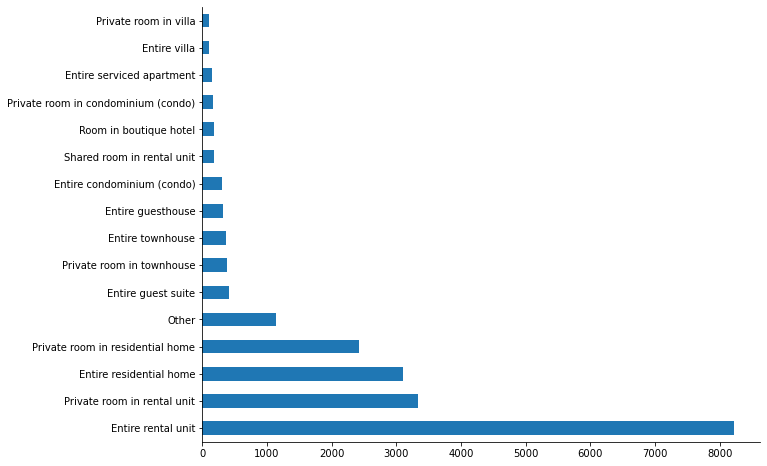

In [38]:
fig, ax = plt.subplots(figsize=(10,8))
df_allf['property_type_aggregate'].value_counts().plot(kind='barh')
sns.despine()
plt.show()

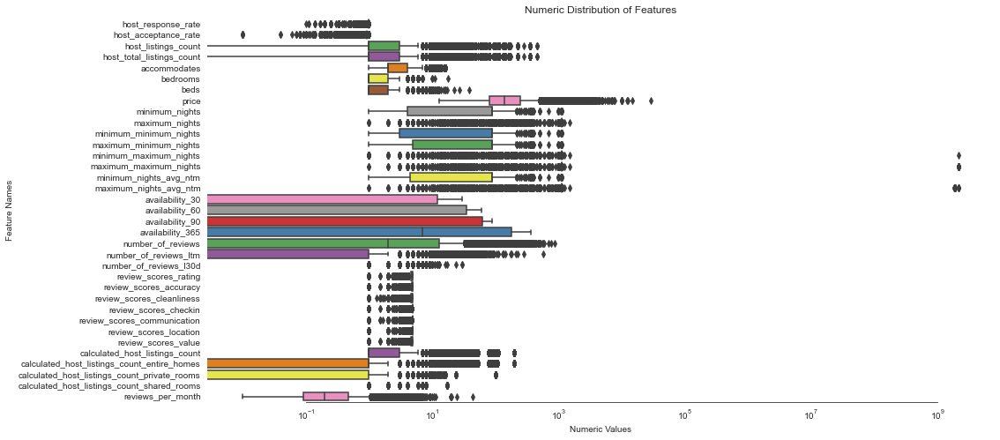

In [39]:
# inspecting the distribution of numerical variable 

sns.set_style("white")
f, ax = plt.subplots(figsize=(16, 8))
ax.set_xscale("log")
ax = sns.boxplot(data=df_allf.select_dtypes(include=["int64", "float64"]), orient="h", palette="Set1")
ax.xaxis.grid(False)
ax.set(ylabel="Feature Names")
ax.set(xlabel="Numeric Values")
ax.set(title="Numeric Distribution of Features")
sns.despine(trim=True, left=True)

In [40]:
# Find skewed numerical features, we want to exclude the price 

skew_features = df_allf.select_dtypes(include=["int64", "float64"]).drop(columns = 'price').apply(lambda x: skew(x)).sort_values(ascending=False)

high_skew = skew_features[skew_features > 0.5]
skew_index = high_skew.index

print("There are {} numerical features with Skew > 0.5 :".format(high_skew.shape[0]))
skewness = pd.DataFrame({'Skew' :high_skew})
skew_features.head(15)

There are 24 numerical features with Skew > 0.5 :


minimum_maximum_nights                          144.488754
maximum_nights_avg_ntm                           36.310399
maximum_maximum_nights                           36.083248
calculated_host_listings_count_shared_rooms      18.726990
number_of_reviews_ltm                            16.195803
calculated_host_listings_count_private_rooms     12.545710
reviews_per_month                                 9.284515
number_of_reviews_l30d                            7.025102
host_total_listings_count                         6.581045
host_listings_count                               6.581045
calculated_host_listings_count_entire_homes       5.808849
maximum_minimum_nights                            5.583624
minimum_nights_avg_ntm                            5.473084
minimum_nights                                    5.419685
minimum_minimum_nights                            5.378297
dtype: float64

In [41]:
# boxcox transformation of skewed features (except the price)

for i in skew_index:
    df_allf[i] = boxcox1p(df_allf[i], boxcox_normmax(df_allf[i] + 1))

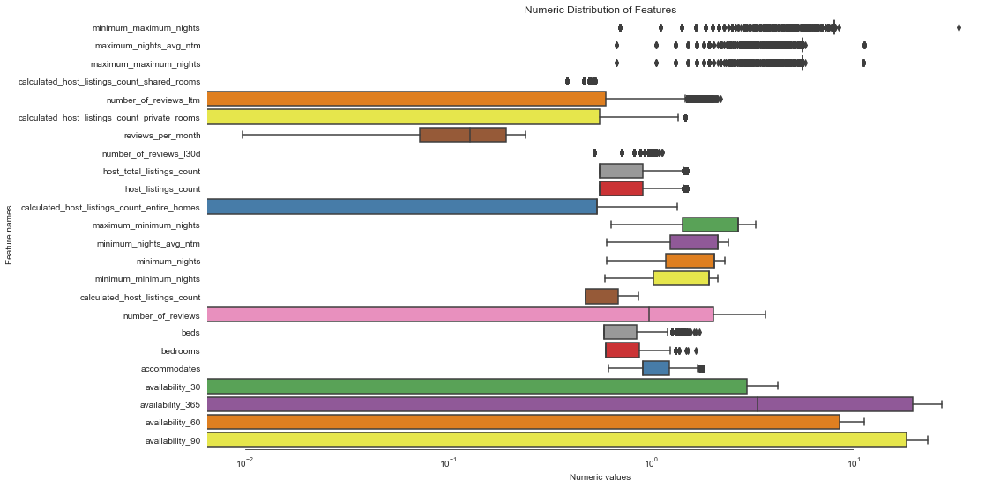

In [42]:
# Re-checking to make sure we handled all the skewed values

sns.set_style("white")
f, ax = plt.subplots(figsize=(16, 9))
ax.set_xscale("log")
ax = sns.boxplot(data=df_allf[skew_index] , orient="h", palette="Set1")
ax.xaxis.grid(False)
ax.set(ylabel="Feature names")
ax.set(xlabel="Numeric values")
ax.set(title="Numeric Distribution of Features")
sns.despine(trim=True, left=True)


 mu = 5.02 and sigma = 0.89



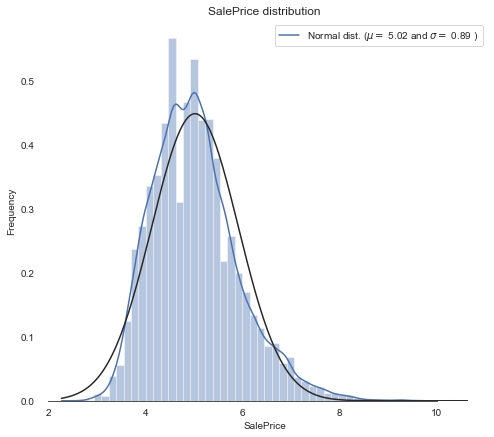

In [43]:
# log1p transformation is applied on the response

df_allf["price"] = np.log1p(df_allf["price"])
df_allf.replace(np.inf, 0, inplace = True)
df_allf.replace(-np.inf, 0, inplace = True)

# check the new distribution of response variable 

sns.set_style("white")
sns.set_color_codes(palette='deep')
f, ax = plt.subplots(figsize=(8, 7))

sns.distplot(df_allf['price'] , fit=norm, color="b");

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df_allf['price'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
ax.xaxis.grid(False)
ax.set(ylabel="Frequency")
ax.set(xlabel="SalePrice")
ax.set(title="SalePrice distribution")
sns.despine(trim=True, left=True)

plt.show()

In [44]:
# dropping "host_listings_count" because it has perfect correlation with "host_total_listings_count"
# they have the exact same elements in both columns, thus one can be dropped 
df_allf = df_allf.drop(["host_listings_count"],axis=1)

In [45]:
# splitting the dataset into training (80%) and test (20%) set 
# for validation set(s), it will be further split during model selection depending on the types of validation used

df_train = df_allf.sample(frac=0.8, random_state=100)
df_test = df_allf[df_allf.index.isin(df_train.index)==False]

In [46]:
# splitting the training and testing data into features and response

train_features = df_train.copy().drop(['price'], axis=1)
test_features = df_test.copy().drop(['price'], axis=1)

train_response = df_train["price"]
test_response = df_test["price"]

In [47]:
# Use CatBoost encoder to encode the categorical variables

cat_predictor = ['neighbourhood_cleansed_aggregate', 'room_type', 'property_type_aggregate', 'host_response_time']

encoder = CatBoostEncoder().fit(train_features[cat_predictor], train_response) # we must use the training set for this
train_features[cat_predictor] = encoder.transform(train_features[cat_predictor])
test_features[cat_predictor] = encoder.transform(test_features[cat_predictor])

In [48]:
df_allf.dtypes

host_response_time                              category
host_response_rate                               float64
host_acceptance_rate                             float64
host_is_superhost                                  uint8
host_total_listings_count                        float64
host_has_profile_pic                               uint8
host_identity_verified                             uint8
room_type                                       category
accommodates                                     float64
bedrooms                                         float64
beds                                             float64
price                                            float64
minimum_nights                                   float64
maximum_nights                                     int64
minimum_minimum_nights                           float64
maximum_minimum_nights                           float64
minimum_maximum_nights                           float64
maximum_maximum_nights         

In [49]:
##-------------- End of Feature Engineering --------------##

## Model 1: Linear ##

In [50]:
def coefplot(model, labels):
    coef = model.coef_
    table = pd.Series(coef.ravel(), index = labels).sort_values(ascending=True, inplace=False)
    
    all_ = True
    if len(table) > 20:
        reference = pd.Series(np.abs(coef.ravel()), index = labels).sort_values(ascending=False, inplace=False)
        reference = reference.iloc[:20]
        table = table[reference.index]
        table = table.sort_values(ascending=True, inplace=False)
        all_ = False
        

    fig, ax = plt.subplots(figsize=(10,8))
    table.T.plot(kind='barh', edgecolor='black', width=0.7, linewidth=.8, alpha=0.9, ax=ax)
    ax.tick_params(axis=u'y', length=0) 
    if all_:
        ax.set_title('Estimated coefficients', fontsize=14)
    else: 
        ax.set_title('Estimated coefficients (20 largest in absolute value)', fontsize=14)
    sns.despine()
    return fig, ax

In [51]:
train_response_linear = train_response.copy()
test_response_linear = test_response.copy()
train_features_linear = train_features.copy()
test_features_linear = test_features.copy()

### Linear Regression

In [52]:
import statsmodels.formula.api as smf
def forward_selected(data, response, nominated = []):
    """Linear model designed by forward selection.

    Parameters:
    -----------
    data : pandas DataFrame with all possible predictors and response

    response: string, name of response column in data

    Returns:
    --------
    model: an "optimal" fitted statsmodels linear model
           with an intercept
           selected by forward selection
           evaluated by adjusted R-squared
    """
    remaining = set(data.columns)
    selected = nominated
    remaining.remove(response)
    remaining ^= set(selected)
    current_score, best_new_score = 0.0, 0.0
    if nominated:
        formula = "{} ~ {} + 1".format(response, ' + '.join(nominated))
        current_score= smf.ols(formula, data).fit().rsquared_adj
        best_new_score = current_score
        print("you nominated variable(s) %s, the adj_r2 is: %f" %(nominated, current_score))
    while remaining and current_score == best_new_score:
        scores_with_candidates = []
        for candidate in remaining:
            formula = "{} ~ {} + 1".format(response,
                                           ' + '.join(selected + [candidate]))
            score = smf.ols(formula, data).fit().rsquared_adj
            scores_with_candidates.append((score, candidate))
        scores_with_candidates.sort()
        best_new_score, best_candidate = scores_with_candidates.pop()
        if current_score < best_new_score:
            print("adding %s increases adj_r2 from %f to %f" %(best_candidate, current_score, best_new_score))
            remaining.remove(best_candidate)
            selected.append(best_candidate)
            current_score = best_new_score
    formula = "{} ~ {} + 1".format(response,
                                   ' + '.join(selected))
    model = smf.ols(formula, data).fit()
    print("final model is %s, with adj_r2 of %f" %(formula, model.rsquared_adj))
    return model

In [53]:
def backward_selected(data, response, nominated = []):
    """Linear model designed by backward selection.

    Parameters:
    -----------
    data : pandas DataFrame with all possible predictors and response

    response: string, name of response column in data

    Returns:
    --------
    model: an "optimal" fitted statsmodels linear model
           with an intercept
           selected by backward selection
           evaluated by adjusted R-squared
    """
    remaining = set(data.columns)
    remaining.remove(response)
    if nominated:
        print("you nominated variables %s" %nominated)
    nominated = set(nominated)
    remaining^=nominated
    formula = "{} ~ {} + 1".format(response,' + '.join(remaining | nominated))
    current_score = smf.ols(formula, data).fit().rsquared_adj
    print("adj_r2 if all variables included: %f" %current_score)
    best_new_score = current_score
    while remaining and current_score == best_new_score:
        scores_with_candidates = []
        for candidate in remaining:
            formula = "{} ~ {} + 1".format(response,
                                           ' + '.join(remaining^{candidate}|nominated))
            score = smf.ols(formula, data).fit().rsquared_adj
            scores_with_candidates.append((score, candidate))
        scores_with_candidates.sort()
        best_new_score, best_candidate = scores_with_candidates.pop()
        if current_score < best_new_score:
            print("deleting %s increases adj_r2 from %f to %f" %(best_candidate, current_score, best_new_score))
            remaining.remove(best_candidate)
            current_score = best_new_score
    formula = "{} ~ {} + 1".format(response,
                                   ' + '.join(remaining|nominated))
    model = smf.ols(formula, data).fit()
    print("final model is %s, with adj_r2 of %f" %(formula, model.rsquared_adj))
    return model

In [54]:
def plot_feature_importance(model, labels, max_features = 20):
    feature_importance = model.feature_importances_*100
    feature_importance = 100*(feature_importance/np.max(feature_importance))
    table = pd.Series(feature_importance, index = labels).sort_values(ascending=True, inplace=False)
    fig, ax = fig, ax = plt.subplots(figsize=(9,6))
    if len(table) > max_features:
        table.iloc[-max_features:].T.plot(kind='barh', edgecolor='black', width=0.7, linewidth=.8, alpha=0.9, ax=ax)
    else:
        table.T.plot(kind='barh', edgecolor='black', width=0.7, linewidth=.8, alpha=0.9, ax=ax)
    ax.tick_params(axis=u'y', length=0) 
    ax.set_title('Variable importance', fontsize=13)
    sns.despine()
    return fig, ax

In [55]:
train_df_linear = train_features_linear.copy()
train_df_linear['price'] = train_response_linear
train_df_linear.head()

,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,room_type,accommodates,bedrooms,...,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,neighbourhood_cleansed_aggregate,property_type_aggregate,price
13981,4.931392,1.0,0.94,0,1.169784,1,1,5.415457,1.100077,1.044027,...,4.57,0,0.800992,0.545537,1.150316,0.0,0.241291,5.389074,5.190300,5.598422
16344,4.931392,0.9,0.38,0,1.417737,1,1,5.415457,1.414193,1.044027,...,4.00,0,0.860625,1.301980,0.000000,0.0,0.084811,5.564828,5.190300,6.660575
18916,4.931392,1.0,0.86,0,0.785239,1,1,4.314970,0.913200,0.599310,...,5.00,0,0.477960,0.000000,0.559960,0.0,0.090537,5.564828,4.860833,5.081404
17877,4.931392,1.0,0.94,0,0.558058,1,1,5.415457,1.100077,0.875394,...,4.77,1,0.477960,0.545537,0.000000,0.0,0.128171,4.570396,6.087434,4.189655
481,5.530540,1.0,0.78,0,0.558058,1,1,5.415457,1.100077,0.875394,...,4.85,0,0.477960,0.545537,0.000000,0.0,0.226768,5.079507,5.519327,4.934474


print(forward_selected(train_df_linear,'price',nominated=[]))

print(backward_selected(train_df_linear,'price',nominated=[]))

In [56]:
predictors_linear = ['instant_bookable','calculated_host_listings_count_private_rooms','host_response_rate','maximum_maximum_nights','number_of_reviews_ltm','review_scores_cleanliness','calculated_host_listings_count_shared_rooms','review_scores_location','bedrooms','minimum_nights','host_total_listings_count','review_scores_rating','review_scores_value','accommodates','reviews_per_month','beds','availability_90','review_scores_accuracy','availability_30','number_of_reviews_l30d','property_type_aggregate','room_type','host_is_superhost','neighbourhood_cleansed_aggregate','availability_365','number_of_reviews','minimum_minimum_nights','has_availability','calculated_host_listings_count','host_response_time']

In [57]:
len(predictors_linear)

30

In [58]:
all_feature_names = train_features_linear.columns.values.tolist()

In [59]:
import statsmodels.formula.api as smf
import statsmodels.api as sm
formula='price ~ accommodates + property_type_aggregate + neighbourhood_cleansed_aggregate + availability_30 + bedrooms + room_type + number_of_reviews + availability_365 + review_scores_cleanliness + calculated_host_listings_count_shared_rooms + calculated_host_listings_count_private_rooms + calculated_host_listings_count + review_scores_value + review_scores_location + maximum_minimum_nights + number_of_reviews_ltm + review_scores_rating + beds + instant_bookable + host_is_superhost + host_response_time + minimum_minimum_nights + host_total_listings_count + has_availability + host_response_rate + minimum_maximum_nights + reviews_per_month + review_scores_accuracy + minimum_nights + availability_90 + 1'
ols = smf.ols(formula=formula, data=train_df_linear).fit()
resid = ols.resid
fitted = ols.fittedvalues
ols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.688
Model:                            OLS   Adj. R-squared:                  0.687
Method:                 Least Squares   F-statistic:                     1223.
Date:                Sun, 05 Jun 2022   Prob (F-statistic):               0.00
Time:                        14:24:51   Log-Likelihood:                -12055.
No. Observations:               16704   AIC:                         2.417e+04
Df Residuals:                   16673   BIC:                         2.441e+04
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
================================================================================================================
                                                   coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------
Intercept                                       -1.4645      0.158     -9.293      0.000      -1.773      -1.156
accommodates                                     0.8343      0.032     26.426      0.000       0.772       0.896
property_type_aggregate                          0.2723      0.013     20.538      0.000       0.246       0.298
neighbourhood_cleansed_aggregate                 0.4782      0.011     43.975      0.000       0.457       0.499
availability_30                                  0.0550      0.006      9.027      0.000       0.043       0.067
bedrooms                                         1.0619      0.041     26.015      0.000       0.982       1.142
room_type                                        0.0574      0.018      3.115      0.002       0.021       0.094
number_of_reviews                               -0.0783      0.005    -14.265      0.000      -0.089      -0.068
availability_365                                 0.0062      0.001      8.494      0.000       0.005       0.008
review_scores_cleanliness                        0.1086      0.011     10.036      0.000       0.087       0.130
calculated_host_listings_count_shared_rooms     -0.9321      0.066    -14.069      0.000      -1.062      -0.802
calculated_host_listings_count_private_rooms    -0.3302      0.021    -15.711      0.000      -0.371      -0.289
calculated_host_listings_count                   0.3183      0.052      6.114      0.000       0.216       0.420
review_scores_value                             -0.1670      0.015    -11.482      0.000      -0.196      -0.139
review_scores_location                           0.1392      0.016      8.976      0.000       0.109       0.170
maximum_minimum_nights                          -0.0186      0.021     -0.875      0.382      -0.060       0.023
number_of_reviews_ltm                           -0.0729      0.011     -6.478      0.000      -0.095      -0.051
review_scores_rating                             0.0261      0.005      5.426      0.000       0.017       0.036
beds                                            -0.1798      0.035     -5.069      0.000      -0.249      -0.110
instant_bookable                                -0.0315      0.009     -3.665      0.000      -0.048      -0.015
host_is_superhost                                0.0633      0.013      4.941      0.000       0.038       0.088
host_response_time                               0.0780      0.021      3.773      0.000       0.037       0.118
minimum_minimum_nights                          -0.1142      0.037     -3.122      0.002      -0.186      -0.042
host_total_listings_count                        0.0497      0.017      2.940      0.003       0.017       0.083
has_availability                

In [60]:
columns=['Test RMSE', 'Test R$^2$', 'Test MAE','Test RMSE on actual values']
rows=["ols"]

results=pd.DataFrame(0.0, columns=columns, index=rows) 

methods = [ols]

for i, method in enumerate(methods):
    if i == 2:
        y_pred = method.predict(test_features_lasso)
    else: 
        y_pred = method.predict(test_features_linear)
    
    results.iloc[i,0] = np.sqrt(mean_squared_error(test_response_linear,y_pred))
    results.iloc[i,1] = r2_score(test_response_linear, y_pred)
    results.iloc[i,2] = mean_absolute_error(test_response_linear, y_pred)
    results.iloc[i,3] = np.sqrt(mean_squared_error(np.expm1(test_response_linear), np.expm1(y_pred)))

results.round(4)

,Test RMSE,Test R$^2$,Test MAE,Test RMSE on actual values
ols,0.4956,0.69,0.3677,386.5178


In [61]:
#linear regression
linear = LinearRegression()
linear.fit(train_features_linear, train_response_linear)

LinearRegression()

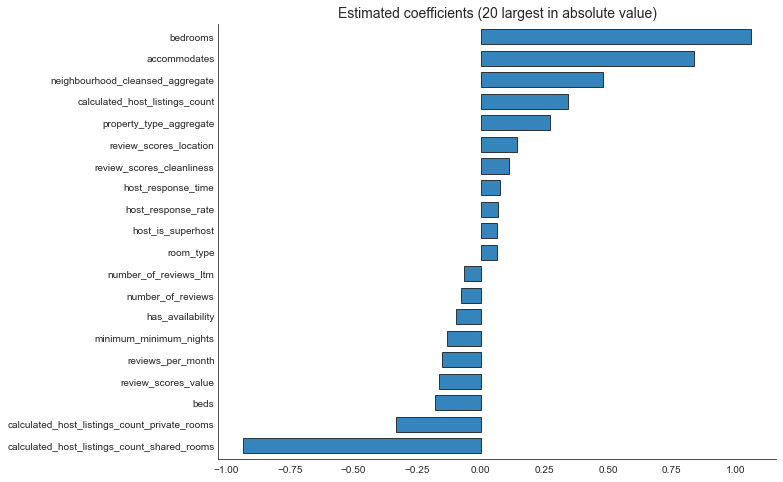

In [62]:
coefplot(linear, list(train_features_linear.columns))
plt.show()

### Ridge

In [63]:
import warnings
warnings.filterwarnings("ignore")

alphas = []
alpha_ridge_rmse = []
previous_alpha = 0.0000000000000001
previous_rmse = np.inf
threshold = 100
count = 0

while count < threshold:
    alpha = previous_alpha + 0.000000000000001
    #print('testing alpha', alpha)
    
    ridge_alpha_test = RidgeCV(cv=10, alphas = [alpha], normalize = True)
    ridge_alpha_test.fit(train_features_linear, train_response_linear)
    ridge_alpha_test_pred = ridge_alpha_test.predict(test_features_linear)
    #alpha_test_pred.append(lasso_alpha_test_pred)
    
    rmse = round(np.sqrt(mean_squared_error(test_response_linear, ridge_alpha_test_pred)), 20)
    #print('rmse is', rmse)
    #print(count)
    if previous_rmse - rmse > 0.00000000005000000:
        count = 0
    else:
        count += 1

    
    
    previous_rmse = rmse
    previous_alpha = alpha
    
    alpha_ridge_rmse.append(rmse)
    alphas.append(alpha)



In [64]:
best_ridge_alpha = alphas[alpha_ridge_rmse.index(min(alpha_ridge_rmse))]
print('ridge alpha prediction RMSE is:', min(alpha_ridge_rmse))
print('that alpha is', best_ridge_alpha)

ridge alpha prediction RMSE is: 0.4957007735464082
that alpha is 1.1000000000000001e-15


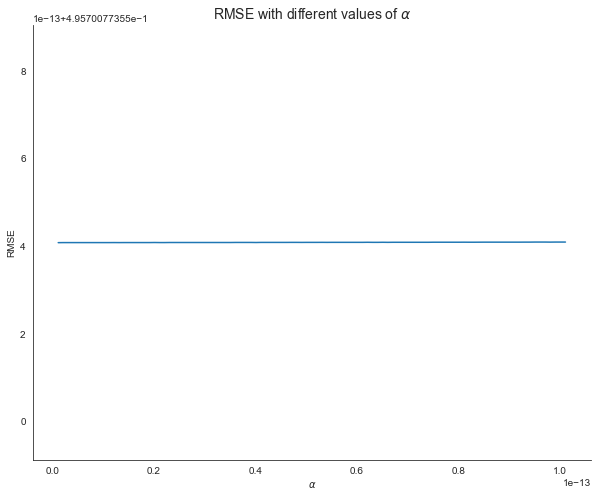

In [65]:
fig, ax = plt.subplots(figsize=(10,8))


ax.plot(alphas, alpha_ridge_rmse)


ax.set_xlabel(r'$\alpha$')
ax.set_ylabel('RMSE')
ax.set_title(r'RMSE with different values of $\alpha$', fontsize=14)
sns.despine()
plt.show()

In [66]:
ridge_log = RidgeCV(normalize = True, cv = 10, alphas = [best_ridge_alpha])
ridge_log.fit(train_features_linear, train_response_linear)

RidgeCV(alphas=array([1.1e-15]), cv=10, normalize=True)

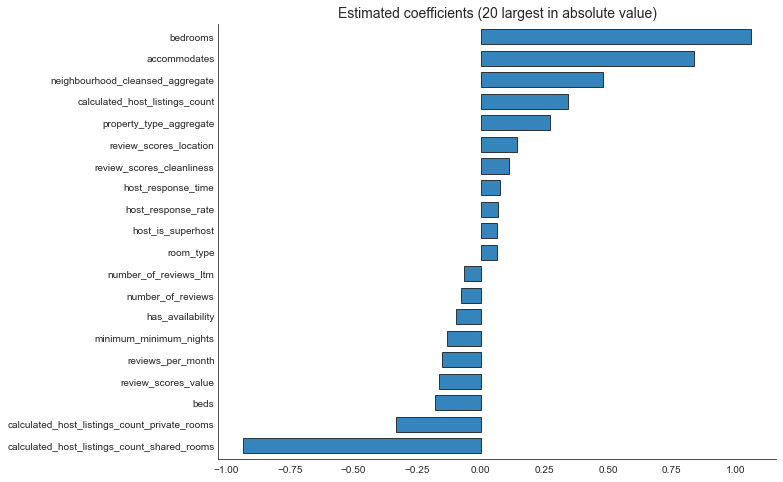

In [67]:
coefplot(ridge_log, list(train_features_linear.columns))
plt.show()

### LASSO

In [68]:
mu_lasso = train_features_linear.mean() # mean for each feature
sigma_lasso = train_features_linear.std() # std for each feature
train_features_lasso = (train_features_linear-mu_lasso)/sigma_lasso #standardise data for lasso
train_features_lasso = train_features_lasso.fillna(0)
test_features_lasso = (test_features_linear-mu_lasso)/sigma_lasso
test_features_lasso = test_features_lasso.fillna(0)

In [69]:
alphas = []
alpha_lasso_rmse = []
previous_alpha = 0.00000000000001
previous_rmse = np.inf
threshold = 100
count = 0

while count < threshold:
    alpha = previous_alpha + 0.00001
    #print('testing alpha', alpha)
    
    lasso_alpha_test = LassoCV(cv=10, random_state=1, max_iter = 2000, alphas = [alpha])
    lasso_alpha_test.fit(train_features_lasso, train_response_linear)
    lasso_alpha_test_pred = lasso_alpha_test.predict(test_features_lasso)
    #alpha_test_pred.append(lasso_alpha_test_pred)
    
    rmse = round(np.sqrt(mean_squared_error(test_response_linear, lasso_alpha_test_pred)), 20)
    if previous_rmse  > rmse:
        count = 0
    else:
        count += 1

    
    
    previous_rmse = rmse
    previous_alpha = alpha
    
    alpha_lasso_rmse.append(rmse)
    alphas.append(alpha)


In [70]:
best_lasso_alpha = alphas[alpha_lasso_rmse.index(min(alpha_lasso_rmse))]
print('lasso alpha prediction RMSE is:', min(alpha_lasso_rmse))
print('that alpha is', best_lasso_alpha)

lasso alpha prediction RMSE is: 0.49568297751634843
that alpha is 0.00019000000001


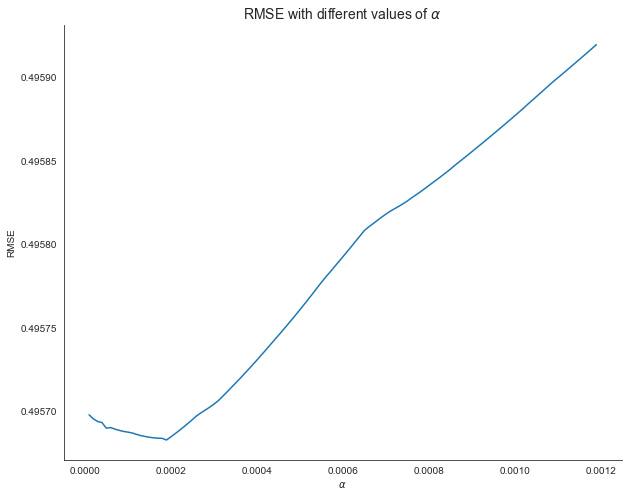

In [71]:
fig, ax = plt.subplots(figsize=(10,8))


ax.plot(alphas, alpha_lasso_rmse)


ax.set_xlabel(r'$\alpha$')
ax.set_ylabel('RMSE')
ax.set_title(r'RMSE with different values of $\alpha$', fontsize=14)
sns.despine()
plt.show()

In [72]:
lasso = LassoCV(cv=10, random_state=1, max_iter = 2000, alphas = [best_lasso_alpha])
lasso.fit(train_features_lasso, train_response_linear)

LassoCV(alphas=[0.00019000000001], cv=10, max_iter=2000, random_state=1)

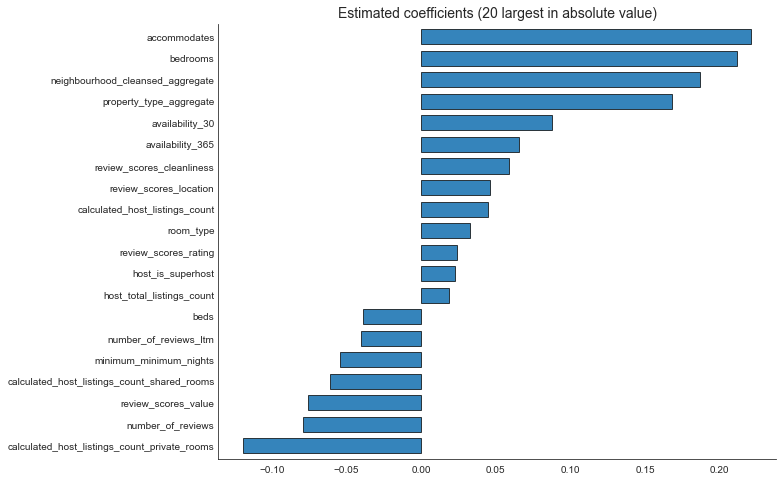

In [73]:
coefplot(lasso, list(train_features_lasso.columns))
plt.show()

In [74]:
lasso_coef = pd.DataFrame(lasso.coef_.round(3), index = list(train_features_lasso.columns)).T
lasso_coef.loc[:, (lasso_coef == 0).all()]

,minimum_nights_avg_ntm,maximum_nights_avg_ntm
0,0.0,-0.0


### Linear Model Predictions

In [75]:
columns=['Test RMSE', 'Test R$^2$', 'Test MAE','Test RMSE on actual values']
rows=["linear", "ridge_alpha_test", "lasso"]

results1=pd.DataFrame(0.0, columns=columns, index=rows) 

methods = [linear,ridge_alpha_test,lasso]

for i, method in enumerate(methods):
    if i == 2:
        y_pred = method.predict(test_features_lasso)
    else: 
        y_pred = method.predict(test_features_linear)
    
    results1.iloc[i,0] = np.sqrt(mean_squared_error(test_response_linear,y_pred))
    results1.iloc[i,1] = r2_score(test_response_linear, y_pred)
    results1.iloc[i,2] = mean_absolute_error(test_response_linear, y_pred)
    results1.iloc[i,3] = np.sqrt(mean_squared_error(np.expm1(test_response_linear), np.expm1(y_pred)))

results1.round(4)

,Test RMSE,Test R$^2$,Test MAE,Test RMSE on actual values
linear,0.4957,0.6899,0.3678,386.5119
ridge_alpha_test,0.4957,0.6899,0.3678,386.5119
lasso,0.4957,0.6900,0.3677,386.6404


## Model 2: Tree-Based ##

In [76]:
train_response_tree = train_response.copy()
test_response_tree = test_response.copy()
train_features_tree = train_features.copy()
test_features_tree = test_features.copy()

In [77]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(train_features_tree, train_response_tree, test_size=0.33, random_state=42)
lgb_train = lgb.Dataset(X_train, y_train)
lgb_eval = lgb.Dataset(X_test,y_test)

# specify your configurations as a dict
params = {
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'metric': {'rmse'},
    'num_leaves': 30,
    'learning_rate': 0.01,
    'feature_fraction': 0.75,
    'bagging_fraction': 0.8,
    'bagging_freq': 5,
    'verbose': 0
}

print('Starting training...')
# train
gbm = lgb.train(params,
                lgb_train,
                num_boost_round=100000,
                valid_sets=lgb_eval,
                callbacks=[lgb.early_stopping(stopping_rounds=10000)])

y_pred = gbm.predict(test_features_tree, num_iteration=gbm.best_iteration)
rmse_test = mean_squared_error(test_response_tree, y_pred) ** 0.5
print(rmse_test)

Starting training...
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001161 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
Training until validation scores don't improve for 10000 rounds
Early stopping, best iteration is:
[2854]	valid_0's rmse: 0.45445
0.445239088863037


In [78]:
import xgboost as xgb
xg_reg = xgb.XGBRegressor()
scores = cross_val_score(xg_reg, train_features_tree,train_response_tree, scoring = 'neg_root_mean_squared_error',n_jobs = -1,cv = 10)
print(np.mean(scores), np.std(scores))
print(scores)

-0.45917303965692274 0.012891717425220757
[-0.45831098 -0.44945582 -0.46810588 -0.45849376 -0.47965033 -0.45461332
 -0.44304911 -0.43726423 -0.46942199 -0.47336497]


In [79]:
def return_score_xgb(param):
    model = xgb.XGBRegressor(**param)
    rmse = -np.mean(cross_val_score(model,train_features_tree,train_response_tree,cv = 5, n_jobs =-1,scoring='neg_root_mean_squared_error'))
    return rmse

In [80]:
def objective(trial):
    param = {
                "n_estimators" : trial.suggest_int('n_estimators', 500, 1000),
                'max_depth':trial.suggest_int('max_depth', 3, 5),
                'reg_alpha':trial.suggest_uniform('reg_alpha',0,6),
                'reg_lambda':trial.suggest_uniform('reg_lambda',0,2),
                'min_child_weight':trial.suggest_int('min_child_weight',0,5),
                'gamma':trial.suggest_uniform('gamma', 0, 4),
                'learning_rate':trial.suggest_loguniform('learning_rate',0.1,0.2),
                'colsample_bytree':trial.suggest_uniform('colsample_bytree',0.4,0.9),
                'subsample':trial.suggest_uniform('subsample',0.4,0.9),
                'nthread' : -1
            }
    return(return_score_xgb(param)) # this will return the rmse score

In [81]:
study1 = optuna.create_study(direction='minimize',sampler=TPESampler())
study1.optimize(objective, n_trials=100,show_progress_bar = True)
study1.best_params

[I 2022-06-05 14:26:12,043] A new study created in memory with name: no-name-7ebaff05-384a-499f-8190-8b77d23b95a3


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2022-06-05 14:26:32,491] Trial 0 finished with value: 0.45700839570453705 and parameters: {'n_estimators': 843, 'max_depth': 4, 'reg_alpha': 3.8031983247092658, 'reg_lambda': 1.1680206533495026, 'min_child_weight': 4, 'gamma': 1.679008724591767, 'learning_rate': 0.15749409744869364, 'colsample_bytree': 0.5943340760476171, 'subsample': 0.7262217199932979}. Best is trial 0 with value: 0.45700839570453705.
[I 2022-06-05 14:26:53,622] Trial 1 finished with value: 0.4596465971067456 and parameters: {'n_estimators': 773, 'max_depth': 5, 'reg_alpha': 2.852878783659947, 'reg_lambda': 1.9721986160721325, 'min_child_weight': 5, 'gamma': 2.2406703711261358, 'learning_rate': 0.11908221392722532, 'colsample_bytree': 0.4760288470998301, 'subsample': 0.4920155558854255}. Best is trial 0 with value: 0.45700839570453705.
[I 2022-06-05 14:27:14,907] Trial 2 finished with value: 0.4643894734936331 and parameters: {'n_estimators': 913, 'max_depth': 4, 'reg_alpha': 3.3487879645166334, 'reg_lambda': 0.13

[I 2022-06-05 14:32:30,021] Trial 20 finished with value: 0.45233032611434565 and parameters: {'n_estimators': 545, 'max_depth': 5, 'reg_alpha': 2.605233673062541, 'reg_lambda': 0.7407991734703043, 'min_child_weight': 1, 'gamma': 1.1926770563796047, 'learning_rate': 0.11354757953663817, 'colsample_bytree': 0.7593260745369379, 'subsample': 0.7966717927756894}. Best is trial 10 with value: 0.44946636607406426.
[I 2022-06-05 14:32:43,077] Trial 21 finished with value: 0.4495079987021501 and parameters: {'n_estimators': 649, 'max_depth': 4, 'reg_alpha': 2.110857816151628, 'reg_lambda': 1.0306313077235099, 'min_child_weight': 5, 'gamma': 0.07756821088793854, 'learning_rate': 0.12568428207616544, 'colsample_bytree': 0.41145638145204183, 'subsample': 0.8899807923472297}. Best is trial 10 with value: 0.44946636607406426.
[I 2022-06-05 14:32:54,063] Trial 22 finished with value: 0.4498860237176158 and parameters: {'n_estimators': 596, 'max_depth': 4, 'reg_alpha': 2.040840758068581, 'reg_lambda'

[I 2022-06-05 14:37:22,009] Trial 40 finished with value: 0.4576388311803548 and parameters: {'n_estimators': 734, 'max_depth': 5, 'reg_alpha': 1.897805413322402, 'reg_lambda': 0.048453250759172395, 'min_child_weight': 1, 'gamma': 2.318496380640905, 'learning_rate': 0.1295348260718699, 'colsample_bytree': 0.5654075135276174, 'subsample': 0.6276072661375452}. Best is trial 35 with value: 0.44869152713309335.
[I 2022-06-05 14:37:37,481] Trial 41 finished with value: 0.4494475596706621 and parameters: {'n_estimators': 635, 'max_depth': 4, 'reg_alpha': 3.2885416540939016, 'reg_lambda': 1.101868009121508, 'min_child_weight': 5, 'gamma': 0.3379058235236626, 'learning_rate': 0.10166409693870533, 'colsample_bytree': 0.4660329493325477, 'subsample': 0.8619597968060094}. Best is trial 35 with value: 0.44869152713309335.
[I 2022-06-05 14:37:52,425] Trial 42 finished with value: 0.45024757722826453 and parameters: {'n_estimators': 677, 'max_depth': 4, 'reg_alpha': 2.3341986255323723, 'reg_lambda':

[I 2022-06-05 14:42:19,164] Trial 60 finished with value: 0.4525431301053665 and parameters: {'n_estimators': 677, 'max_depth': 5, 'reg_alpha': 3.5105508490030313, 'reg_lambda': 1.3901867361696107, 'min_child_weight': 5, 'gamma': 0.5715418497335434, 'learning_rate': 0.19797511067788978, 'colsample_bytree': 0.40121867138919676, 'subsample': 0.8056997376315971}. Best is trial 52 with value: 0.4485084555331338.
[I 2022-06-05 14:42:29,644] Trial 61 finished with value: 0.4492746071534442 and parameters: {'n_estimators': 576, 'max_depth': 4, 'reg_alpha': 1.3527040050563788, 'reg_lambda': 1.1567400798181238, 'min_child_weight': 5, 'gamma': 0.017429208336552482, 'learning_rate': 0.12625334394586898, 'colsample_bytree': 0.4152082710139091, 'subsample': 0.8858096786568627}. Best is trial 52 with value: 0.4485084555331338.
[I 2022-06-05 14:42:40,618] Trial 62 finished with value: 0.448736122661839 and parameters: {'n_estimators': 572, 'max_depth': 4, 'reg_alpha': 1.408155249159614, 'reg_lambda':

[I 2022-06-05 14:46:35,469] Trial 80 finished with value: 0.4502399322222911 and parameters: {'n_estimators': 638, 'max_depth': 4, 'reg_alpha': 0.9976372691511672, 'reg_lambda': 1.6623241074755557, 'min_child_weight': 5, 'gamma': 0.11125089107366204, 'learning_rate': 0.11724873688780127, 'colsample_bytree': 0.4436498777058295, 'subsample': 0.8143198525791147}. Best is trial 52 with value: 0.4485084555331338.
[I 2022-06-05 14:46:48,950] Trial 81 finished with value: 0.4488321651220371 and parameters: {'n_estimators': 614, 'max_depth': 4, 'reg_alpha': 1.8997298794122033, 'reg_lambda': 1.04853681180776, 'min_child_weight': 5, 'gamma': 0.36648247287606395, 'learning_rate': 0.12092826409629855, 'colsample_bytree': 0.47835050685122604, 'subsample': 0.856791748438352}. Best is trial 52 with value: 0.4485084555331338.
[I 2022-06-05 14:47:02,016] Trial 82 finished with value: 0.45013805941465906 and parameters: {'n_estimators': 620, 'max_depth': 4, 'reg_alpha': 2.189634658106813, 'reg_lambda': 

{'n_estimators': 623,
 'max_depth': 4,
 'reg_alpha': 3.559152113272053,
 'reg_lambda': 1.1170887685768731,
 'min_child_weight': 5,
 'gamma': 0.1891465401977506,
 'learning_rate': 0.10500902573939033,
 'colsample_bytree': 0.4691807746097045,
 'subsample': 0.8312818279869754}

In [82]:
params = {}
print(f"without tuning {return_score_xgb(params)}")
print(f"with tuning {return_score_xgb(study1.best_params)}")

without tuning 0.461658820248387
with tuning 0.4485084555331338


In [83]:
xgboost = xgb.XGBRegressor(**study1.best_params)
xgboost.fit(train_features_tree, train_response_tree)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1,
             colsample_bytree=0.4691807746097045, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None,
             gamma=0.1891465401977506, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.10500902573939033, max_bin=256,
             max_cat_to_onehot=4, max_delta_step=0, max_depth=4, max_leaves=0,
             min_child_weight=5, missing=nan, monotone_constraints='()',
             n_estimators=623, n_jobs=0, num_parallel_tree=1, predictor='auto',
             random_state=0, reg_alpha=3.559152113272053,
             reg_lambda=1.1170887685768731, ...)

In [84]:
optuna.visualization.plot_slice(study1)

In [86]:
# Light Gradient Boosting Regressor
lightgbm = lgb.LGBMRegressor(objective='regression', 
                       num_leaves=6,
                       learning_rate=0.01, 
                       n_estimators=7000,
                       max_bin=200, 
                       bagging_fraction=0.8,
                       bagging_freq=4, 
                       bagging_seed=8,
                       feature_fraction=0.2,
                       feature_fraction_seed=8,
                       min_sum_hessian_in_leaf = 11,
                       verbose=-1,
                       random_state=42)

# Random Forest Regressor
rf = RandomForestRegressor(n_estimators=1200,
                          max_depth=15,
                          min_samples_split=5,
                          min_samples_leaf=5,
                          max_features=None,
                          oob_score=True,
                          random_state=42)

In [90]:
# fitting the data
xgboost.fit(train_features_tree, train_response_tree)
lightgbm.fit(train_features_tree, train_response_tree)
rf.fit(train_features_tree, train_response_tree)

RandomForestRegressor(max_depth=15, max_features=None, min_samples_leaf=5,
                      min_samples_split=5, n_estimators=1200, oob_score=True,
                      random_state=42)

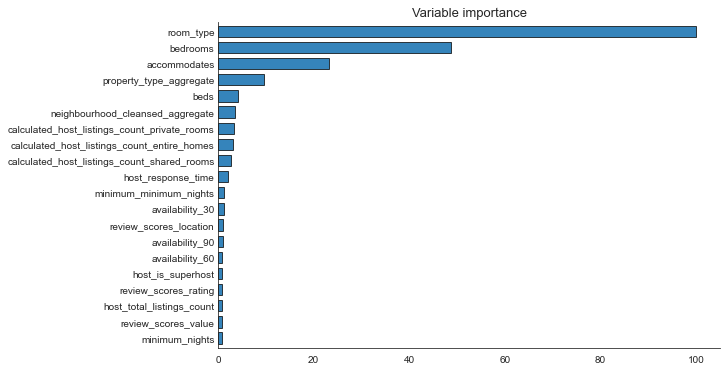

In [91]:
plot_feature_importance(xgboost, labels=train_features_tree.columns)
plt.show()

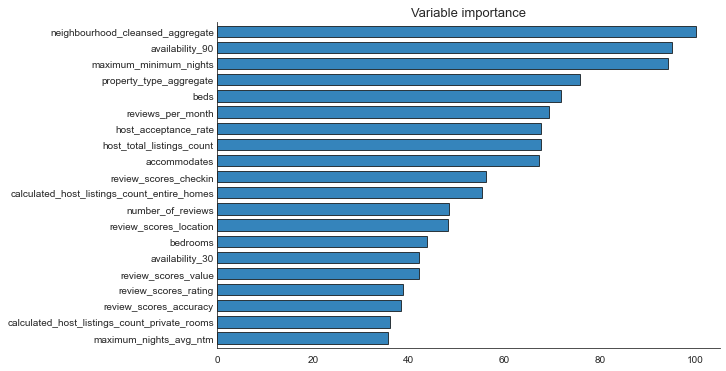

In [92]:
plot_feature_importance(lightgbm, labels=train_features_tree.columns)
plt.show()

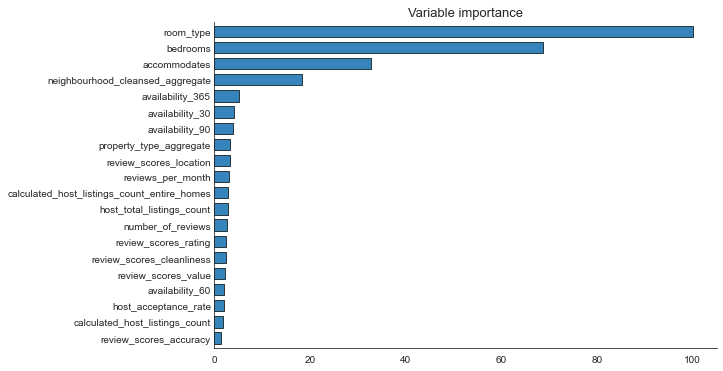

In [93]:
plot_feature_importance(rf, labels=train_features_tree.columns)
plt.show()

In [95]:
columns=['Test RMSE', 'Test R$^2$', 'Test MAE','Test RMSE on actual values']
rows=['LightGBM', "XGBoost", "Random Forests"]

results2=pd.DataFrame(0.0, columns=columns, index=rows) 

methods = [lightgbm, xgboost, rf]

for i, method in enumerate(methods):

    y_pred = method.predict(test_features_tree)
    
    results2.iloc[i,0] = np.sqrt(mean_squared_error(test_response_tree, y_pred))
    results2.iloc[i,1] = r2_score(test_response_tree, y_pred)
    results2.iloc[i,2] = mean_absolute_error(test_response_tree, y_pred)
    results2.iloc[i,3] = np.sqrt(mean_squared_error(np.expm1(test_response_tree), np.expm1(y_pred)))

results2.round(4)

,Test RMSE,Test R$^2$,Test MAE,Test RMSE on actual values
LightGBM,0.4450,0.7501,0.3235,344.6125
XGBoost,0.4426,0.7528,0.3194,336.3305
Random Forests,0.4618,0.7308,0.3338,349.2307


## Model 3: Neural Network ##

In [96]:
# we will be using the pytorch library for neural network regression

from torch import nn
from torch.utils.data import DataLoader
from sklearn.preprocessing import StandardScaler

In [97]:
# some data processing for the neural network model to work correctly 

train_features_nn = train_features.copy().to_numpy()
test_features_nn = test_features.copy().to_numpy()

train_response_nn = train_response.copy().to_numpy()
test_response_nn = test_response.copy().to_numpy()

# fit features into standardscaler()

scaler = StandardScaler()
scaler.fit(train_features_nn)

X_train_nn = scaler.transform(train_features_nn)
X_test_nn = scaler.transform(test_features_nn)

X_train_nn.shape

In [98]:
class BNBDataset(torch.utils.data.Dataset):

    def __init__(self, X, y, scale_data=True):
        self.X = torch.from_numpy(X).float()
        self.y = torch.from_numpy(y).float()
    def __len__(self):
        return len(self.X)

    def __getitem__(self, i):
        return self.X[i,:], self.y[i]

In [99]:
class NeuralNetwork(nn.Module):
    
    def __init__(self):
        super().__init__()
        self.layers = nn.Sequential(            
            nn.Linear(42, 128),            
            nn.ReLU(),                       
            nn.Linear(128, 128),
            nn.ReLU(),  
            nn.Linear(128, 128),
            nn.ReLU(),
            nn.Linear(128, 1),
        )                        


    def forward(self, features):        
        return self.layers(features).flatten() # returns a flat array as desired

In [100]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

dfn = NeuralNetwork().to(device)

print(dfn)

NeuralNetwork(
  (layers): Sequential(
    (0): Linear(in_features=42, out_features=128, bias=True)
    (1): ReLU()
    (2): Linear(in_features=128, out_features=128, bias=True)
    (3): ReLU()
    (4): Linear(in_features=128, out_features=128, bias=True)
    (5): ReLU()
    (6): Linear(in_features=128, out_features=1, bias=True)
  )
)


In [101]:
def train_loop(dataloader, model, loss_fn, optimiser):
    
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    
    n_batches = len(dataloader)
    n_obs = len(dataloader.dataset)
    
    for batch, (features, response) in enumerate(dataloader):
        
        # Move data to GPU, if available
        features = features.to(device)
        response  = response.to(device)
        
        # Compute the predictions (forward pass)
        prediction = model(features)
        
        # Evaluate cost function
        loss = loss_fn(prediction, response)

        # Compute gradient (backward pass)
        optimiser.zero_grad()
        loss.backward()
        
        # Update parameters
        optimiser.step()

        # Print progress
        if batch % int(np.floor(0.2*n_batches)) == 0:
            loss, current = loss.item(), batch * len(response)
            print(f"Loss: {loss:>7f}  [{current:>5d}/{n_obs:>5d}]")

In [102]:
def validation(model):
    
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    
    # Predicted probabilities 
    # the .cpu().detach().numpy() part transfers the result the cpu and converts it to a numpy array
    with torch.no_grad():
        y_pred = model(torch.from_numpy(test_features_nn).float().to(device)).cpu().detach().numpy()
    
    # Metrics
    rmse_nn = np.sqrt(mean_squared_error(test_response_nn, y_pred))
    r2_nn = r2_score(test_response_nn, y_pred)
    mae_nn = mean_absolute_error(test_response_nn, y_pred)

    print('')
    print('Validation metrics \n')
    print(f"RMSE: {np.round(rmse_nn, 4)}")
    print(f"R^2: {np.round(r2_nn, 4)}")
    print(f"MAE: {np.round(mae_nn, 4)}")

In [103]:
train_data = BNBDataset(train_features_nn, train_response_nn)

In [104]:
from torch.utils.data import DataLoader

train_loader = DataLoader(train_data, batch_size = 128, shuffle=True)

In [105]:
X, y = next(iter(train_loader))

In [106]:
epochs = 100
learning_rate = 1e-3

loss_fn = nn.MSELoss() 
optimiser = torch.optim.Adam(dfn.parameters(), lr = learning_rate) # Adam tends to work well as a default
 
for i in range(epochs):
    print(f"Epoch {i+1}\n-------------------------------")
    train_loop(train_loader, dfn, loss_fn, optimiser)
    validation(dfn)

print("Done!")

Epoch 1
-------------------------------
Loss: 26.525816  [    0/16704]
Loss: 1.924730  [ 3328/16704]
Loss: 1.149039  [ 6656/16704]
Loss: 0.800371  [ 9984/16704]
Loss: 0.570151  [13312/16704]
Loss: 0.400195  [ 8320/16704]

Validation metrics 

RMSE: 0.76
R^2: 0.2712
MAE: 0.569
Epoch 2
-------------------------------
Loss: 0.476826  [    0/16704]
Loss: 0.628312  [ 3328/16704]
Loss: 0.896239  [ 6656/16704]
Loss: 0.579351  [ 9984/16704]
Loss: 0.430268  [13312/16704]
Loss: 0.538228  [ 8320/16704]

Validation metrics 

RMSE: 0.771
R^2: 0.2499
MAE: 0.641
Epoch 3
-------------------------------
Loss: 0.676207  [    0/16704]
Loss: 0.349253  [ 3328/16704]
Loss: 0.371688  [ 6656/16704]
Loss: 0.389557  [ 9984/16704]
Loss: 0.503286  [13312/16704]
Loss: 1.736457  [ 8320/16704]

Validation metrics 

RMSE: 0.6251
R^2: 0.507
MAE: 0.4994
Epoch 4
-------------------------------
Loss: 0.437752  [    0/16704]
Loss: 0.520079  [ 3328/16704]
Loss: 0.516521  [ 6656/16704]
Loss: 0.427973  [ 9984/16704]
Loss: 0.

Loss: 0.263076  [ 6656/16704]
Loss: 0.264795  [ 9984/16704]
Loss: 0.249657  [13312/16704]
Loss: 0.268705  [ 8320/16704]

Validation metrics 

RMSE: 0.5057
R^2: 0.6772
MAE: 0.3781
Epoch 31
-------------------------------
Loss: 0.191989  [    0/16704]
Loss: 0.335821  [ 3328/16704]
Loss: 0.212276  [ 6656/16704]
Loss: 0.261212  [ 9984/16704]
Loss: 0.244257  [13312/16704]
Loss: 0.446074  [ 8320/16704]

Validation metrics 

RMSE: 0.5586
R^2: 0.6062
MAE: 0.41
Epoch 32
-------------------------------
Loss: 0.284589  [    0/16704]
Loss: 0.357545  [ 3328/16704]
Loss: 0.212766  [ 6656/16704]
Loss: 0.361041  [ 9984/16704]
Loss: 0.287293  [13312/16704]
Loss: 0.172004  [ 8320/16704]

Validation metrics 

RMSE: 0.5199
R^2: 0.6589
MAE: 0.4019
Epoch 33
-------------------------------
Loss: 0.240307  [    0/16704]
Loss: 0.283007  [ 3328/16704]
Loss: 0.279015  [ 6656/16704]
Loss: 0.246906  [ 9984/16704]
Loss: 0.423419  [13312/16704]
Loss: 0.380916  [ 8320/16704]

Validation metrics 

RMSE: 0.6204
R^2: 0.

Loss: 0.381436  [ 3328/16704]
Loss: 0.263579  [ 6656/16704]
Loss: 0.263897  [ 9984/16704]
Loss: 0.265059  [13312/16704]
Loss: 0.254711  [ 8320/16704]

Validation metrics 

RMSE: 0.5067
R^2: 0.676
MAE: 0.3768
Epoch 61
-------------------------------
Loss: 0.145823  [    0/16704]
Loss: 0.182696  [ 3328/16704]
Loss: 0.277056  [ 6656/16704]
Loss: 0.256644  [ 9984/16704]
Loss: 0.408526  [13312/16704]
Loss: 0.273037  [ 8320/16704]

Validation metrics 

RMSE: 0.5046
R^2: 0.6787
MAE: 0.38
Epoch 62
-------------------------------
Loss: 0.204394  [    0/16704]
Loss: 0.278918  [ 3328/16704]
Loss: 0.271734  [ 6656/16704]
Loss: 0.294263  [ 9984/16704]
Loss: 0.241767  [13312/16704]
Loss: 0.265839  [ 8320/16704]

Validation metrics 

RMSE: 0.505
R^2: 0.6782
MAE: 0.374
Epoch 63
-------------------------------
Loss: 0.180987  [    0/16704]
Loss: 0.189243  [ 3328/16704]
Loss: 0.160464  [ 6656/16704]
Loss: 0.283562  [ 9984/16704]
Loss: 0.206832  [13312/16704]
Loss: 0.224268  [ 8320/16704]

Validation met

Loss: 0.213917  [ 8320/16704]

Validation metrics 

RMSE: 0.4981
R^2: 0.687
MAE: 0.3796
Epoch 90
-------------------------------
Loss: 0.414149  [    0/16704]
Loss: 0.150796  [ 3328/16704]
Loss: 0.237907  [ 6656/16704]
Loss: 0.185197  [ 9984/16704]
Loss: 0.228769  [13312/16704]
Loss: 0.221738  [ 8320/16704]

Validation metrics 

RMSE: 0.5236
R^2: 0.6541
MAE: 0.3834
Epoch 91
-------------------------------
Loss: 0.236670  [    0/16704]
Loss: 0.260451  [ 3328/16704]
Loss: 0.196151  [ 6656/16704]
Loss: 0.477002  [ 9984/16704]
Loss: 0.298852  [13312/16704]
Loss: 0.183891  [ 8320/16704]

Validation metrics 

RMSE: 0.5187
R^2: 0.6604
MAE: 0.4025
Epoch 92
-------------------------------
Loss: 0.266667  [    0/16704]
Loss: 0.567312  [ 3328/16704]
Loss: 0.309975  [ 6656/16704]
Loss: 0.292750  [ 9984/16704]
Loss: 0.228669  [13312/16704]
Loss: 0.193859  [ 8320/16704]

Validation metrics 

RMSE: 0.5161
R^2: 0.6639
MAE: 0.3999
Epoch 93
-------------------------------
Loss: 0.213424  [    0/16704]
L

In [107]:
columns=['Test RMSE', 'Test R$^2$', 'Test MAE','Test RMSE on actual values']
rows=["Neural Network"]

results3=pd.DataFrame(0.0, columns=columns, index=rows) 

methods = [nn]

for i, method in enumerate(methods):

    y_pred = dfn(torch.from_numpy(test_features_nn).float().to(device)).cpu().detach().numpy()
    
    results3.iloc[i,0] = np.sqrt(mean_squared_error(test_response_nn, y_pred))
    results3.iloc[i,1] = r2_score(test_response_nn, y_pred)
    results3.iloc[i,2] = mean_absolute_error(test_response_nn, y_pred)
    results3.iloc[i,3] = np.sqrt(mean_squared_error(np.expm1(test_response_nn), np.expm1(y_pred)))
    
results.round(4)

,Test RMSE,Test R$^2$,Test MAE,Test RMSE on actual values
ols,0.4956,0.69,0.3677,386.5178


# Module 4: Generalised Additive Models

In [ ]:
train_response_gam = train_response.copy()
test_response_gam = test_response.copy()
train_features_gam = train_features.copy()
test_features_gam = test_features.copy()

## Analysis before regression

In [ ]:
def plotregressions(X, y, lowess=False):
    # X should be a pandas dataframe
    
    colours = ['#4E79A7','#F28E2C','#E15759','#76B7B2','#59A14F', 
          '#EDC949','#AF7AA1','#FF9DA7','#9C755F','#BAB0AB']

    # Feature names
    labels = list(X.columns)
    
    n, p = X.shape
    
    # We want three plots per column, calculate the required number of rows accordingly
    rows = int(np.ceil(p/3)) 
    
    # Create a plot grid
    fig, axes = plt.subplots(rows, 3, figsize=(12, rows*(12/4)))

    # Loop over the plot grid, create 
    for i, ax in enumerate(fig.axes):
        if i < p:
            
            # Scatter plot with local smoothing
            sns.regplot(X.iloc[:, i], y,  ci=None, y_jitter=0.05, 
                        scatter_kws={'s': 25, 'alpha':.8}, ax=ax, lowess=lowess, color=colours[i % 10])
            
            # Remove axis labels to de-clutter the plot
            ax.set_xlabel('')
            ax.set_ylabel('')
            
            # Manually set the limits for the horizontal axis since the default doesn't work so well
            xmin = X.iloc[:,i].min()
            xmax = X.iloc[:,i].max()
            ax.set_xlim(xmin - (xmax-xmin)*0.05, xmax + (xmax - xmin)*0.05)
            
            # Use the feature name for the title
            ax.set_title(labels[i])
        
        else:
            # Delete unnecessary subplots (last row)
            fig.delaxes(ax)

    sns.despine()
    plt.tight_layout()
    
    return fig, axes

In [ ]:
plotregressions(train_features_gam, train_response_gam, lowess=True)
plt.show()

In [ ]:
from patsy import dmatrix, build_design_matrices

predictor = 'bedrooms'
X = dmatrix('cr(variable, df=3) - 1', {'variable': train_features_gam[predictor]})

ols = LinearRegression()
ols.fit(X, train_response_gam)

xmin = train_features_gam[predictor].min()
xmax = train_features_gam[predictor].max()
x = np.linspace(xmin, xmax)

XX = build_design_matrices([X.design_info], {'variable': x})[0] 
y_fitted = ols.predict(XX)

fig, ax = plt.subplots(figsize=(8,5))
sns.regplot(train_features_gam[predictor], train_response_gam,  scatter_kws = {'s': 25}, fit_reg=False)
ax.plot(x, y_fitted, color='Black', alpha=0.7)
ax.set_ylabel('Customer Lifetime Value')
ax.set_title('Natural cubic spline', fontsize=13, fontweight='bold')

sns.despine()
plt.show()

In [ ]:
from pygam import LinearGAM, s, f, l, te
gam = LinearGAM(f(0) + l(1) + s(2) + l(3) + s(4) + l(5) + l(6) + te(7,8,9,10) + te(11,12,13,14,15,16,17,18) + l(19) + te(20,21,22,23)+ te(24,25,26) + l(27) + te(28,29,30,31,32,33) + l(34) + s(35) + f(36) + f(37) + f(38) + l(39) + f(40) +f(41))

In [ ]:
def objective(trial):

    lambdas = []
    for j in range(42):
        lambdas.append(trial.suggest_loguniform(f'lambda_{j}', 1e-4, 100000.0))
                               
    model = LinearGAM(f(0) + l(1) + s(2) + l(3) + l(4) + l(5) + l(6) + f(7) + s(8) + s(9) + s(10)+ te(11,13,14,17)+ l(12) + l(15)+ l(16) + l(18) + l(19) + l(20)+l(21)+l(22)+l(23) + l(24) + l(25)+l(26)+l(27)+l(28)+l(29)+l(30) + l(31) + l(32) + l(33) + l(34) + s(35) + f(36) + f(37) + f(38)+ l(39) + f(40) + f(41), lam = lambdas)
    model.fit(train_features_gam, train_response_gam)
    
    return model.statistics_['GCV']

sampler = TPESampler(seed=42)  # makes the sampler behave in a deterministic way
study2 = optuna.create_study(direction='minimize', sampler=sampler) # TPE is a method for Bayesian optimisation
study2.optimize(objective, n_trials=100, timeout=120) 

In [89]:
lambdas = list(study2.best_params.values())

gam = LinearGAM(f(0) + l(1) + s(2) + l(3) + l(4) + l(5) + l(6) + f(7) + s(8) + s(9) + s(10)+ te(11,13,14,17)+ l(12) + l(15)+ l(16) + l(18) + l(19) + l(20)+l(21)+l(22)+l(23) + l(24) + l(25)+l(26)+l(27)+l(28)+l(29)+l(30) + l(31) + l(32) + l(33) + l(34) + s(35) + f(36) + f(37) + f(38)+ l(39) + f(40) + f(41), lam = lambdas)
gam.fit(train_features_gam, train_response_gam)

NameError: name 'study' is not defined

In [ ]:
gam.summary()

In [ ]:
for j, term in enumerate(gam.terms):
    
    if term.isintercept:
        continue

    XX = gam.generate_X_grid(term=j)
    pdep, confi = gam.partial_dependence(term=j, X=XX, width=0.95)

    plt.figure()
    plt.plot(XX[:, term.feature], pdep)
    
    plt.plot(XX[:, term.feature], confi, c='black', ls='--', alpha=0.5)
    
    plt.plot(XX[:, term.feature], confi, c='black', ls='--', alpha=0.5)
    
    plt.ylim(-2, 2)
        
    plt.title(predictors[j])
    sns.despine()
    plt.show()

In [ ]:
# Initialise table
columns=['RMSE', 'R-Squared', 'MAE','Test RMSE on actual values']
rows=['GAM']
results4 =pd.DataFrame(0.0, columns=columns, index=rows)

# List algorithms
methods = [gam] 

# Computer test predictions and metrics
for i, method in enumerate(methods):
    
    y_pred = method.predict(test_features_gam)
    
    results4.iloc[i, 0] = np.sqrt(mean_squared_error(test_response, y_pred))
    results4.iloc[i, 1] = r2_score(test_response, y_pred)
    results4.iloc[i, 2] = mean_absolute_error(test_response, y_pred)
    results4.iloc[i, 3] = np.sqrt(mean_squared_error(np.expm1(test_response_gam), np.expm1(y_pred)))
    
results4.round(4)

# Model 5: Model Stack

In [ ]:
train_response_stack = train_response.copy()
test_response_stack = test_response.copy()
train_features_stack = train_features.copy()
test_features_stack = test_features.copy()

In [ ]:
clfs = [linear,
        xgboost,
        nn,
        gam
]

In [ ]:
# we will be performing a model stack using Sklearn's stacking regressor 
# model stacking is only performed on the 3 best-performing models 

X_train_stack  = np.zeros((train_features_stack.shape[0], len(clfs)))
X_test_stack = np.zeros((test_features_stack.shape[0], len(clfs))) 
n_folds = 10
kf = KFold(n_splits=n_folds, shuffle=False)
for i,clf in enumerate(clfs):
    if i == 2:
        for train_index,test_index in kf.split(train_features_stack):
            X_train_stack[test_index,i] = dfn(torch.from_numpy(train_features_stack.iloc[test_index].to_numpy()).float().to(device)).cpu().detach().numpy()
    else:
        for train_index,test_index in kf.split(train_features_stack):
            tr_x = train_features_stack.iloc[train_index]
            tr_y = train_response_stack.iloc[train_index]
            clf.fit(tr_x,tr_y)
            X_train_stack[test_index,i] = clf.predict(train_features_stack.iloc[test_index])

In [ ]:
clf_second = LinearRegression()
clf_second.fit(X_train_stack,train_response_stack)
for i,clf in enumerate(clfs):
    if i == 2:
        y_pred = dfn(torch.from_numpy(test_features_stack.to_numpy()).float().to(device)).cpu().detach().numpy()
        X_test_stack[:,i] = y_pred
    else:
        y_pred = clf.predict(test_features_stack)
        X_test_stack[:,i] = y_pred

pred = clf_second.predict(X_test_stack)

In [ ]:
print(clf_second.coef_)

In [ ]:
results5=pd.DataFrame(0.0, columns=columns, index=rows) 
    
results5.loc['Stacking model','Test RMSE'] = np.sqrt(mean_squared_error(test_response_stack, pred))
results5.loc['Stacking model','Test R$^2$'] = r2_score(test_response_stack, pred)
results5.loc['Stacking model','Test MAE'] = mean_absolute_error(test_response_stack, pred)
results5.loc['Stacking model','Test RMSE on actual values']np.sqrt(mean_squared_error(np.expm1(test_response_stack), np.expm1(pred)))

results5.round(4)

In [ ]:
from xgboost import XGBRegressor
clf_second_v2 = XGBRegressor(learning_rate=0.01,
                       n_estimators=6000,
                       max_depth=4,
                       min_child_weight=0,
                       gamma=0.6,
                       subsample=0.7,
                       colsample_bytree=0.7,
                       objective='reg:linear',
                       nthread=-1,
                       scale_pos_weight=1,
                       seed=27,
                       reg_alpha=0.00006,
                       random_state=42)
clf_second_v2.fit(X_train_stack,train_response_stack)
for i,clf in enumerate(clfs):
    if i == 2:
        y_pred = dfn(torch.from_numpy(test_features_stack.to_numpy()).float().to(device)).cpu().detach().numpy()
        X_test_stack[:,i] = y_pred
    else:
        y_pred = clf.predict(test_features_stack)
        X_test_stack[:,i] = y_pred

pred = clf_second_v2.predict(X_test_stack)

In [ ]:
results6=pd.DataFrame(0.0, columns=columns, index=rows) 
    
results6.loc['Stacking model_xgboost','Test RMSE'] = np.sqrt(mean_squared_error(test_response_stack, pred))
results6.loc['Stacking model_xgboost','Test R$^2$'] = r2_score(test_response_stack, pred)
results6.loc['Stacking model_xgboost','Test MAE'] = mean_absolute_error(test_response_stack, pred)
results6.loc['Stacking model_xgboost','Test RMSE on actual values']np.sqrt(mean_squared_error(np.expm1(test_response_stack), np.expm1(pred)))

results6.round(4)

In [ ]:
results_all = pd.concat([results1, results2, results3, results4, results5, results6])
results_all.round(4)

## Linear Model

In [ ]:
mu_lasso = train_features.mean() # mean for each feature
sigma_lasso = train_features.std() # std for each feature
train_features_lasso = (train_features-mu_lasso)/sigma_lasso #standardise data for lasso
train_features_lasso = train_features.fillna(0)
test_features_lasso = (train_features-mu_lasso)/sigma_lasso
test_features_lasso = test_features.fillna(0)

In [ ]:
alphas = []
alpha_lasso_rmse = []
previous_alpha = 0.00000000000001
previous_rmse = np.inf
threshold = 100
count = 0

while count < threshold:
    alpha = previous_alpha + 0.00001
    #print('testing alpha', alpha)
    
    lasso_alpha_test = LassoCV(cv=10, random_state=1, max_iter = 2000, alphas = [alpha])
    lasso_alpha_test.fit(train_features_lasso, train_response_linear)
    lasso_alpha_test_pred = lasso_alpha_test.predict(test_features_lasso)
    #alpha_test_pred.append(lasso_alpha_test_pred)
    
    rmse = round(np.sqrt(mean_squared_error(test_response_linear, lasso_alpha_test_pred)), 20)
    if previous_rmse  > rmse:
        count = 0
    else:
        count += 1

    
    
    previous_rmse = rmse
    previous_alpha = alpha
    
    alpha_lasso_rmse.append(rmse)
    alphas.append(alpha)

In [ ]:
fig, ax = plt.subplots(figsize=(10,8))


ax.plot(alphas, alpha_lasso_rmse)


ax.set_xlabel(r'$\alpha$')
ax.set_ylabel('RMSE')
ax.set_title(r'RMSE with different values of $\alpha$', fontsize=14)
sns.despine()
plt.show()

In [ ]:
best_lasso_alpha = alphas[alpha_lasso_rmse.index(min(alpha_lasso_rmse))]
print('lasso alpha prediction RMSE is:', min(alpha_lasso_rmse))
print('that alpha is', best_lasso_alpha)

In [ ]:
lasso = LassoCV(cv=10, random_state=1, max_iter = 2000, alphas = [best_lasso_alpha])
lasso.fit(train_features_lasso, train_response_linear)

In [ ]:
def coefplot(model, labels):
    coef = model.coef_
    table = pd.Series(coef.ravel(), index = labels).sort_values(ascending=True, inplace=False)
    
    all_ = True
    if len(table) > 20:
        reference = pd.Series(np.abs(coef.ravel()), index = labels).sort_values(ascending=False, inplace=False)
        reference = reference.iloc[:20]
        table = table[reference.index]
        table = table.sort_values(ascending=True, inplace=False)
        all_ = False
        

    fig, ax = plt.subplots(figsize=(10,8))
    table.T.plot(kind='barh', edgecolor='black', width=0.7, linewidth=.8, alpha=0.9, ax=ax)
    ax.tick_params(axis=u'y', length=0) 
    if all_:
        ax.set_title('Estimated coefficients', fontsize=14)
    else: 
        ax.set_title('Estimated coefficients (20 largest in absolute value)', fontsize=14)
    sns.despine()
    return fig, ax

In [ ]:
coefplot(lasso, list(train_features_lasso.columns))
plt.show()

In [ ]:
lasso_coef = pd.DataFrame(lasso.coef_.round(3), index = list(train_features_lasso.columns)).T
lasso_coef.loc[:, (lasso_coef == 0).all()]

Two insights:


*   the host response time has a significant impact on the price of the listing compare to other predictors
*   host response rate and whether host has a profile pic don't affect the price

